In [1]:
import os
import random
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style("whitegrid")
%matplotlib inline

import cv2
from glob import glob
from itertools import chain

from skimage.io import imread, imshow, concatenate_images
from skimage.transform import resize
from skimage.morphology import label
from skimage.color import rgb2gray
from sklearn.model_selection import train_test_split

import tensorflow as tf
from tensorflow.keras import Input
from tensorflow.keras.models import Model, load_model, save_model
from tensorflow.keras.layers import Input, Activation, BatchNormalization,UpSampling2D, Dropout, Lambda, Conv2D, Conv2DTranspose, MaxPooling2D, Concatenate
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.optimizers.schedules import PolynomialDecay

from tensorflow.keras import backend as K
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

#import segmentation_models as sm

### Loading the image and mask paths

In [2]:
# Setting size parameters of images
im_width = 256
im_height = 256

In [3]:
image_filenames_train = []

# creating a list of all files containing the word 'mask'
mask_files = glob('/kaggle/input/input-data/lgg-mri-segmentation/kaggle_3m/*/*_mask*')

for i in mask_files:
    image_filenames_train.append(i.replace('_mask', ''))

print(image_filenames_train[:10])
len(image_filenames_train)

['/kaggle/input/input-data/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_56.tif', '/kaggle/input/input-data/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_8.tif', '/kaggle/input/input-data/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_34.tif', '/kaggle/input/input-data/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_33.tif', '/kaggle/input/input-data/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_43.tif', '/kaggle/input/input-data/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_39.tif', '/kaggle/input/input-data/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_7.tif', '/kaggle/input/input-data/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_31.tif', '/kaggle/input/input-data/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_6.tif', '/kaggle/inp

3929

### Plotting few images and masks

In [4]:
mask_files[0]

'/kaggle/input/input-data/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_56_mask.tif'

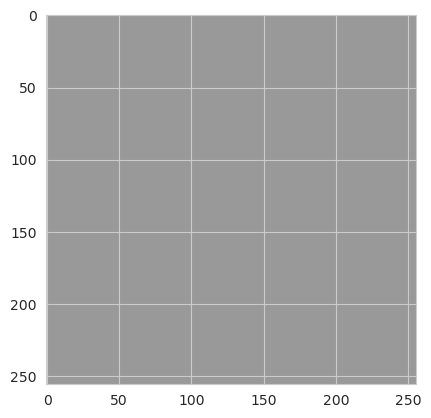

In [5]:
mask = cv2.imread(mask_files[0])
plt.imshow(mask, alpha=0.4)

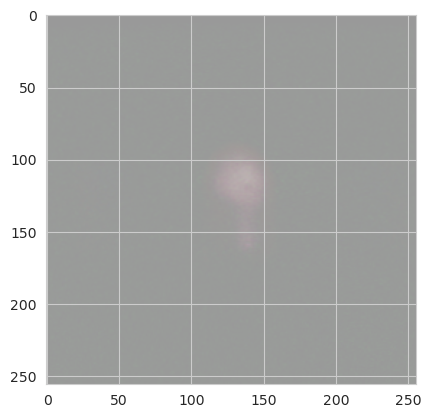

In [6]:
img = cv2.imread(image_filenames_train[0])
plt.imshow(img, alpha=0.4)

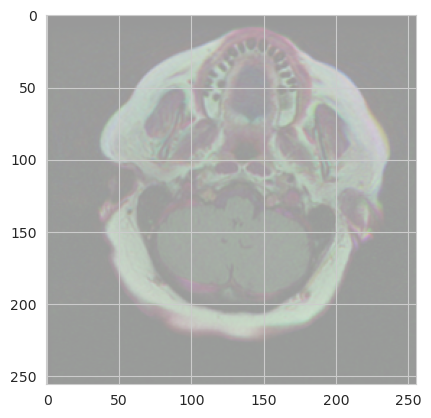

In [7]:
img = cv2.imread(image_filenames_train[1])
plt.imshow(img, alpha=0.4)

In [8]:
#a custome function to plot images form img_path
def plot_from_img_path(rows, columns, list_img_path, list_mask_path):
    fig = plt.figure(figsize=(12, 12))
    for i in range(1, rows * columns + 1):
        fig.add_subplot(rows, columns, i)
        img_path = list_img_path[i]
        mask_path = list_mask_path[i]
        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        mask = cv2.imread(mask_path)
        plt.imshow(image)
        plt.imshow(mask, alpha=0.4)
    plt.show()

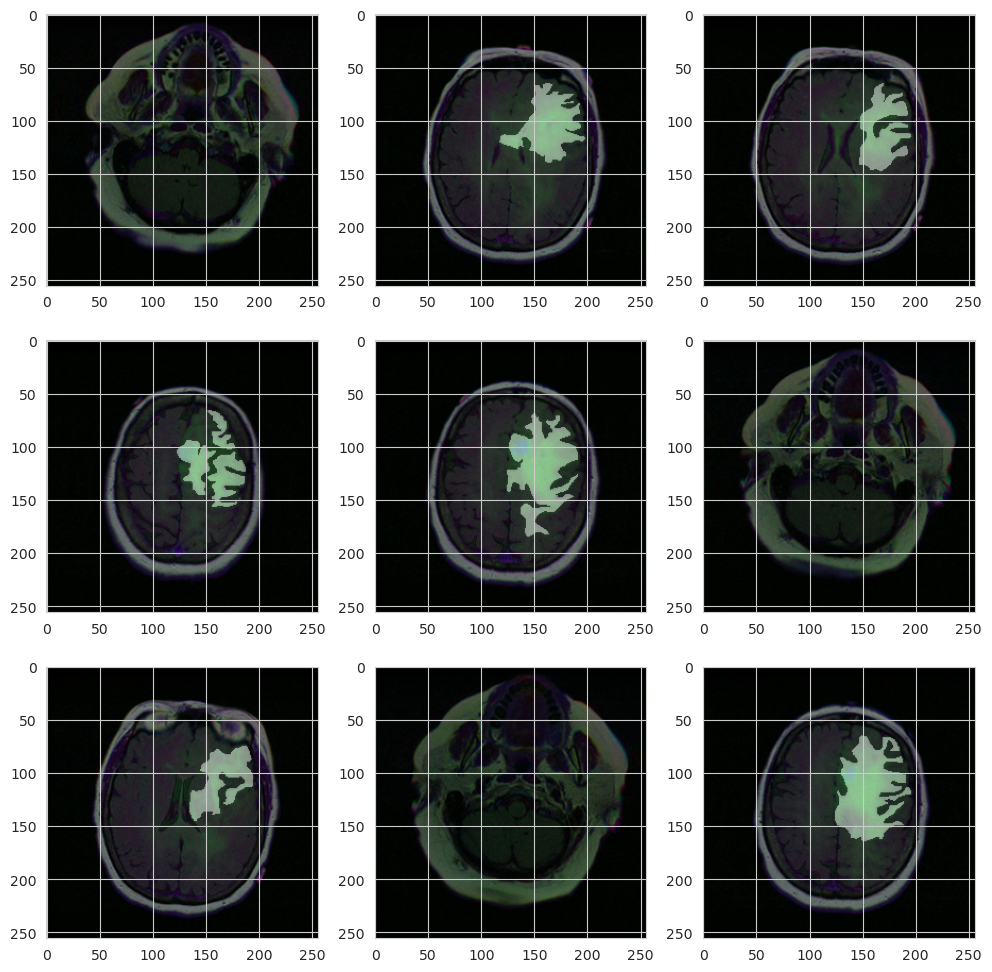

In [9]:
plot_from_img_path(3, 3 , image_filenames_train, mask_files )

### Create data frame and train test split

In [10]:
df = pd.DataFrame(data={'image_filenames_train': image_filenames_train, 'mask': mask_files })

df_train, df_test = train_test_split(df, test_size=0.1)

# Further split this val and train
df_train, df_val = train_test_split(df_train, test_size=0.2)

print(df_train.shape)
print(df_test.shape)
print(df_val.shape)

(2828, 2)
(393, 2)
(708, 2)


### Data genertator, data augmentation and adjust data

In [11]:
# Referring Code From: https://github.com/zhixuhao/unet/blob/master/data.py
def train_generator(
    data_frame,
    batch_size,
    augmentation_dict,
    image_color_mode="rgb",
    mask_color_mode="grayscale",
    image_save_prefix="image",
    mask_save_prefix="mask",
    save_to_dir=None,
    target_size=(256, 256),
    seed=1,
):
    """
    can generate image and mask at the same time use the same seed for
    image_datagen and mask_datagen to ensure the transformation for image
    and mask is the same if you want to visualize the results of generator,
    set save_to_dir = "your path"
    """
    image_datagen = ImageDataGenerator(**augmentation_dict)
    mask_datagen = ImageDataGenerator(**augmentation_dict)

    image_generator = image_datagen.flow_from_dataframe(
        data_frame,
        x_col="image_filenames_train",
        class_mode=None,
        color_mode=image_color_mode,
        target_size=target_size,
        batch_size=batch_size,
        save_to_dir=save_to_dir,
        save_prefix=image_save_prefix,
        seed=seed,
    )
    mask_generator = mask_datagen.flow_from_dataframe(
        data_frame,
        x_col="mask",
        class_mode=None,
        color_mode=mask_color_mode,
        target_size=target_size,
        batch_size=batch_size,
        save_to_dir=save_to_dir,
        save_prefix=mask_save_prefix,
        seed=seed,
    )

    train_gen = zip(image_generator, mask_generator)
    
    # Final return Tuple after image Normalization and Diagnostics
    for (img, mask) in train_gen:
        img, mask = normalize_and_diagnose(img, mask)
        yield (img, mask)

In [12]:
''' After mask Normalization if the value is <= 0.5 then that Mask 
will be considered a complete black one and does not have any Tumor '''
def normalize_and_diagnose(img, mask):
    img = img / 255
    mask = mask / 255
    mask[mask > 0.5] = 1
    mask[mask <= 0.5] = 0
    return(img, mask)

In [13]:
def conv_block(inputs, num_filters):
    x = Conv2D(num_filters, 3, padding="same")(inputs)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    x = Conv2D(num_filters, 3, padding="same")(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    return x

def encoder_block(inputs, num_filters):
    x = conv_block(inputs, num_filters)
    p = MaxPooling2D((2, 2))(x)
    return x, p

def decoder_block(inputs, skip_features, num_filters):
    x = Conv2DTranspose(num_filters, 2, strides=2, padding="same")(inputs)
    x = Concatenate()([x, skip_features])
    x = conv_block(x, num_filters)
    return x

def build_unet(input_shape):
    inputs = Input(input_shape)

    s1, p1 = encoder_block(inputs, 64)
    s2, p2 = encoder_block(p1, 128)
    s3, p3 = encoder_block(p2, 256)
    s4, p4 = encoder_block(p3, 512)

    b1 = conv_block(p4, 1024)

    d1 = decoder_block(b1, s4, 512)
    d2 = decoder_block(d1, s3, 256)
    d3 = decoder_block(d2, s2, 128)
    d4 = decoder_block(d3, s1, 64)

    outputs = Conv2D(1, 1, padding="same", activation="sigmoid")(d4)

    model = Model(inputs, outputs, name="UNET")
    return model

if __name__ == "__main__":
    input_shape = (256, 256, 3)
    model = build_unet(input_shape)
    model.summary()

Model: "UNET"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 256, 256, 64  1792        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 256, 256, 64  256        ['conv2d[0][0]']                 
 alization)                     )                                                              

In [15]:
input_shape = (256, 256, 3)
model_unet_VO = build_unet(input_shape)

In [16]:
def dice_coef(y_true, y_pred, smooth=1):
    """
    Dice = (2*|X & Y|)/ (|X|+ |Y|)
         =  2*sum(|A*B|)/(sum(A^2)+sum(B^2))
    """
    intersection = K.sum(K.abs(y_true * y_pred), axis=-1)
    return (2. * intersection + smooth) / (K.sum(K.square(y_true),-1) + K.sum(K.square(y_pred),-1) + smooth)

def dice_coef_loss(y_true, y_pred):
    return 1-dice_coef(y_true, y_pred)

def iou(y_true, y_pred, smooth=100):
    intersection = K.sum(y_true * y_pred)
    sum = K.sum(y_true + y_pred)
    iou = (intersection + smooth) / (sum - intersection + smooth)
    return iou

In [17]:
BATCH_SIZE = 32

In [18]:
train_generator_param = dict(rotation_range=0.2,
                            width_shift_range=0.05,
                            height_shift_range=0.05,
                            shear_range=0.05,
                            zoom_range=0.05,
                            horizontal_flip=True,
                            fill_mode='nearest')

train_gen = train_generator(df_train, BATCH_SIZE,
                                train_generator_param,
                                target_size=(im_height, im_width))
    
val_gen = train_generator(df_val, BATCH_SIZE,
                                dict(),
                                target_size=(im_height, im_width))


### base model--Unet model

In [22]:
learning_rate = 1e-4

num_train_steps = len(df_train) * EPOCHS
lr_scheduler = PolynomialDecay(initial_learning_rate=learning_rate,end_learning_rate=0.,
                               decay_steps=num_train_steps)
optimizer = Adam(learning_rate=lr_scheduler)
metrics=["binary_accuracy", iou, dice_coef]


model_unet_V0.compile(optimizer=optimizer, loss=dice_coef_loss, 
              metrics=metrics)
callbacks_unet = [ModelCheckpoint('unet.hdf5', verbose=1, save_best_only=True)]
history_unet = model_unet.fit(train_gen,
                    steps_per_epoch=len(df_train) / BATCH_SIZE, 
                    epochs=20, 
                    callbacks=callbacks_unet,
                    validation_data = val_gen,
                    validation_steps=len(df_val) / BATCH_SIZE)

Found 2828 validated image filenames.

Found 2828 validated image filenames.

Epoch 1/20

89/88 [==============================] - ETA: -1s - loss: 0.0449 - binary_accuracy: 0.9433 - iou: 0.0356 - dice_coef: 0.9551Found 708 validated image filenames.

Found 708 validated image filenames.



Epoch 1: val_loss improved from inf to 0.12853, saving model to unet.hdf5

88/88 [==============================] - 217s 2s/step - loss: 0.0449 - binary_accuracy: 0.9433 - iou: 0.0356 - dice_coef: 0.9551 - val_loss: 0.1285 - val_binary_accuracy: 0.9896 - val_iou: 0.0104 - val_dice_coef: 0.8715

Epoch 2/20

89/88 [==============================] - ETA: -1s - loss: 0.0093 - binary_accuracy: 0.9934 - iou: 0.0619 - dice_coef: 0.9907

Epoch 2: val_loss improved from 0.12853 to 0.04324, saving model to unet.hdf5

88/88 [==============================] - 169s 2s/step - loss: 0.0093 - binary_accuracy: 0.9934 - iou: 0.0619 - dice_coef: 0.9907 - val_loss: 0.0432 - val_binary_accuracy: 0.9899 - val_iou: 0.0091

In [23]:
model_unet.save('unet.hdf5')

In [27]:
import matplotlib as mpl
mpl.rcParams['figure.figsize'] = (12, 10)

def plot_metrics(history):
  metrics = ['loss', "binary_accuracy", "iou", "dice_coef"]
  for n, metric in enumerate(metrics):
    plt.subplot(2,2,n+1)
    plt.plot(history.epoch, history.history[metric], 'y', label='Train')
    plt.plot(history.epoch, history.history['val_'+metric], 'r', linestyle="--", label='Val')
    plt.xlabel('Epoch')
    plt.ylabel(metric)
    plt.legend()

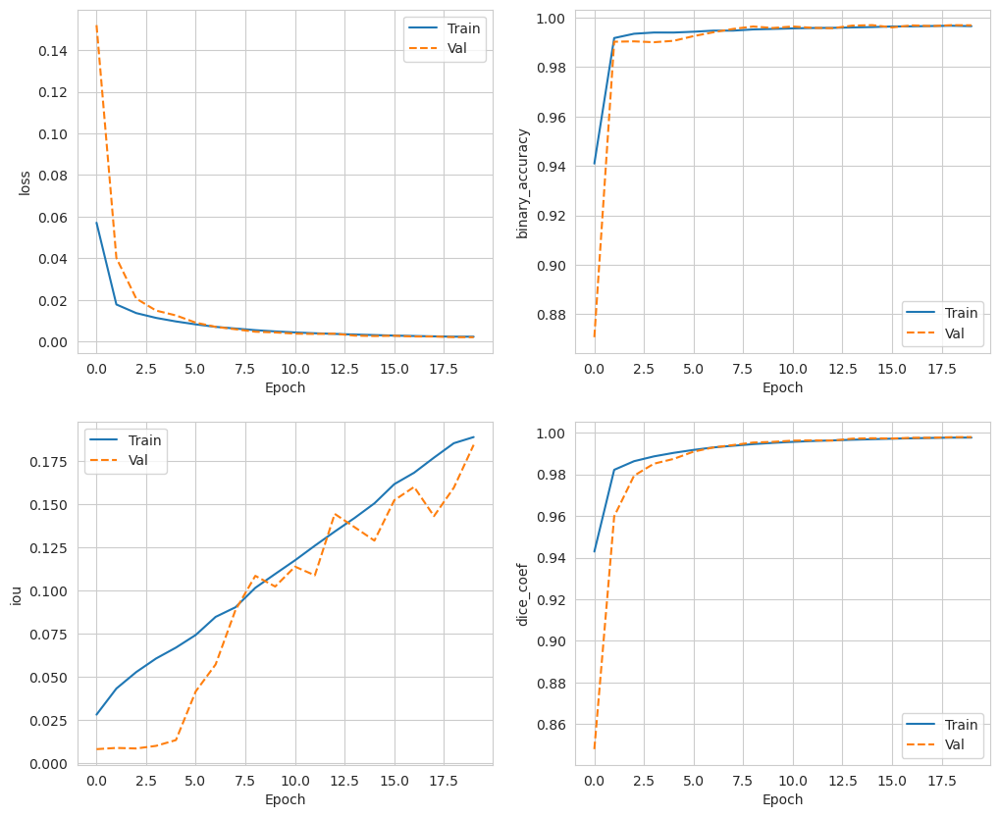

In [35]:
plot_metrics(history_unet)

#### Evaluate Unet Model

In [29]:
test_gen = train_generator(df_test, BATCH_SIZE, dict(), target_size=(im_height, im_width))

results = model_unet.evaluate(test_gen, steps=len(df_test) / BATCH_SIZE )

print('Test Loss ', results[0] )
print('Test Binary Accuracy ', results[1] )
print('Test IoU ', results[2] )
print('Test Dice Coefficient ', results[3] )

Found 393 validated image filenames.

Found 393 validated image filenames.

12/12 [==============================] - 6s 488ms/step - loss: 0.0021 - binary_accuracy: 0.9961 - iou: 0.2417 - dice_coef: 0.9979

Test Loss  0.002109834225848317

Test Binary Accuracy  0.9960886240005493

Test IoU  0.24171233177185059

Test Dice Coefficient  0.9978901147842407


#### Plotting Predicted Masks Segmentation results from the Test Image set

In [19]:
def plot_segmentation_result(model):
    for i in range(20):
        index = np.random.randint(1, len(df_test.index))
        img = cv2.imread(df_test['image_filenames_train'].iloc[index])
        img = cv2.resize(img, (im_height, im_width))
        img = img/255
        # print(imgs.shape) (256, 256 , 3)
        img = img[np.newaxis, :, :, : ]
        # print(img.shape) # (1, 256, 256, 3)

        predicted_img = model.predict(img)

        plt.figure(figsize=(12, 12))
        plt.subplot(1, 3, 1)
        plt.imshow(np.squeeze(img))
        plt.title('Original Image')

        plt.subplot(1, 3, 2)
        plt.imshow(np.squeeze(cv2.imread(df_test['mask'].iloc[index])))
        plt.title('Original Mask')

        plt.subplot(1, 3, 3)
        plt.imshow(np.squeeze(predicted_img) > 0.5 )
        plt.title('Prediction')
        plt.show()

1/1 [==============================] - 2s 2s/step


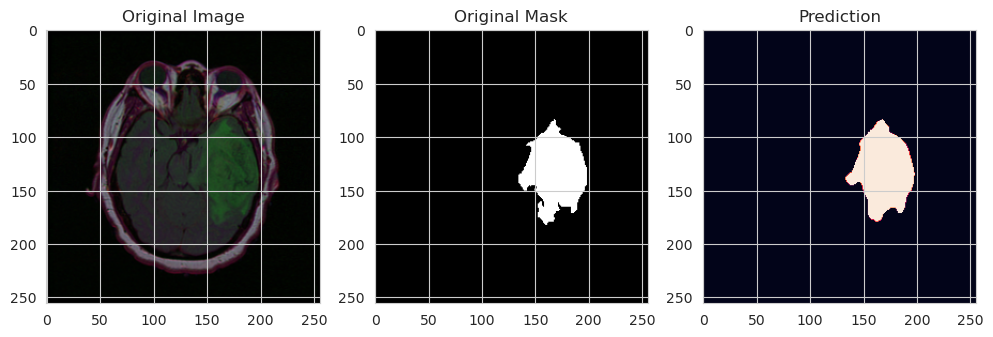

1/1 [==============================] - 0s 27ms/step


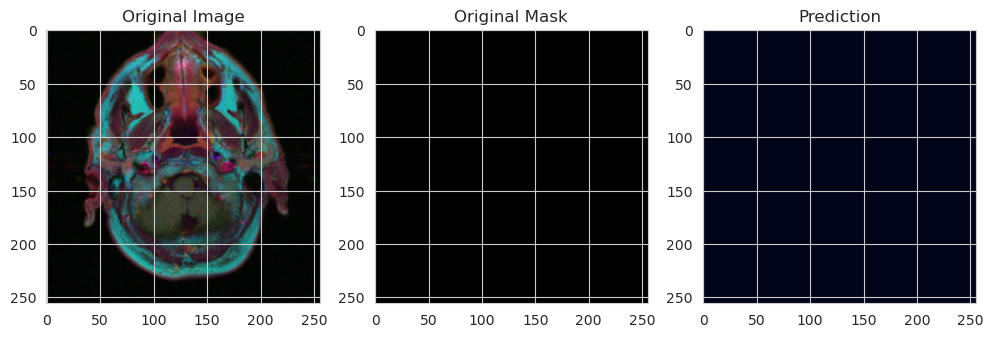

1/1 [==============================] - 0s 26ms/step


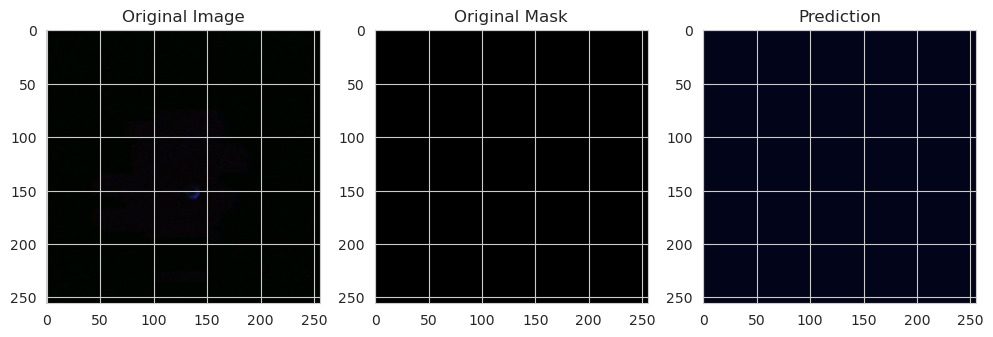

1/1 [==============================] - 0s 26ms/step


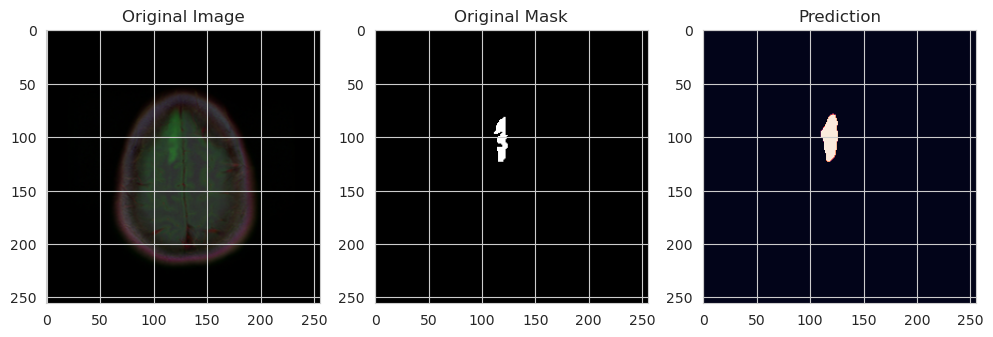

1/1 [==============================] - 0s 28ms/step


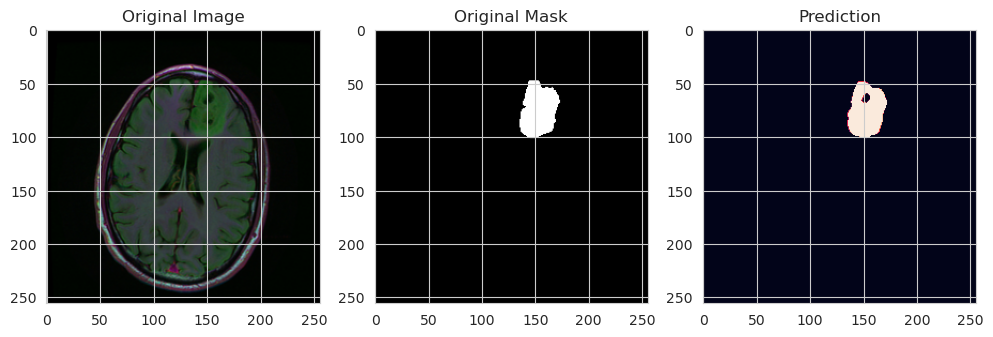

1/1 [==============================] - 0s 26ms/step


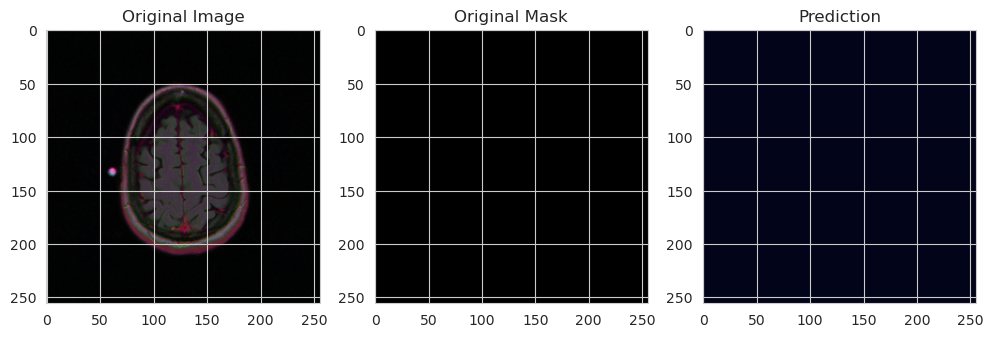

1/1 [==============================] - 0s 26ms/step


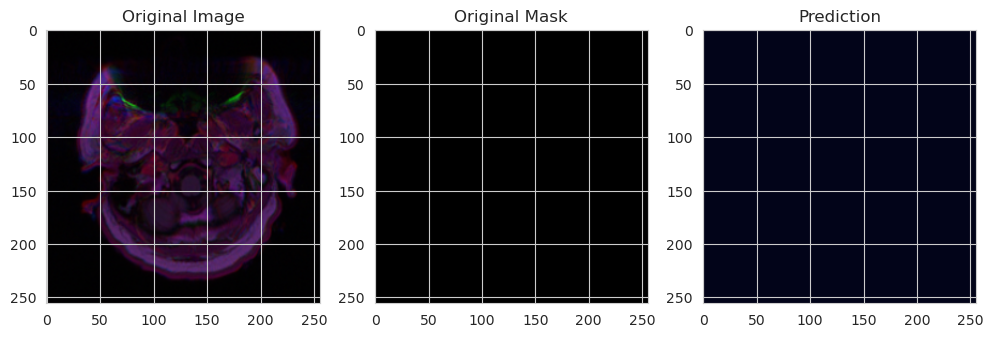

1/1 [==============================] - 0s 43ms/step


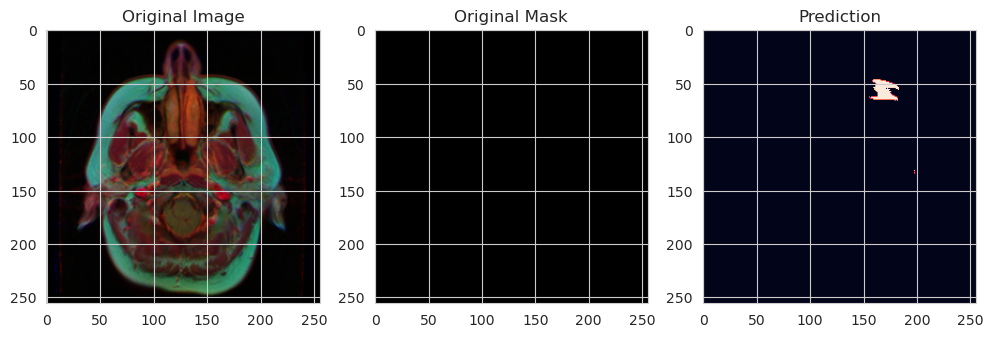

1/1 [==============================] - 0s 28ms/step


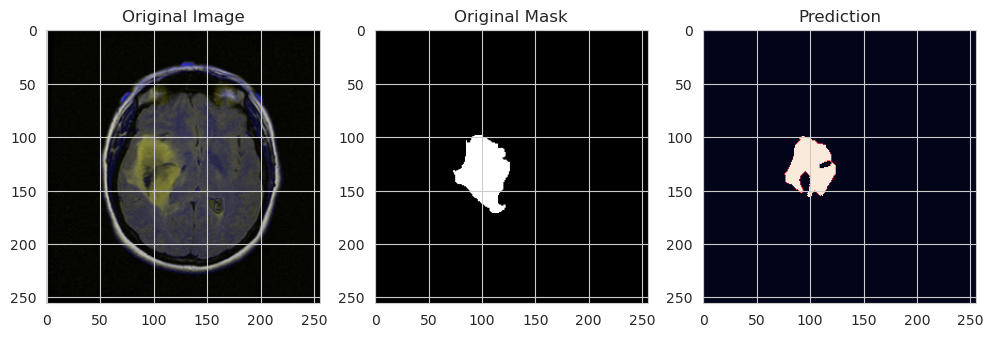

1/1 [==============================] - 0s 26ms/step


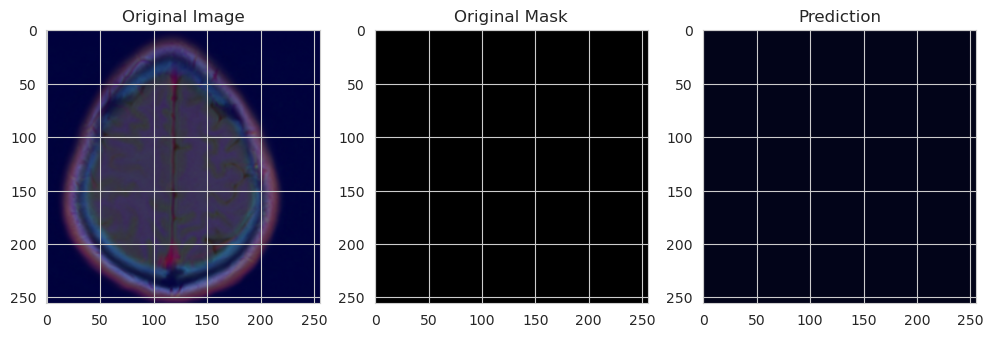

1/1 [==============================] - 0s 28ms/step


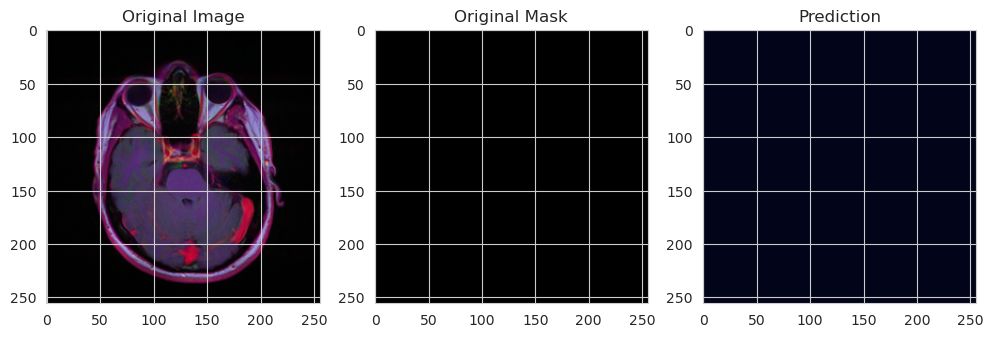

1/1 [==============================] - 0s 25ms/step


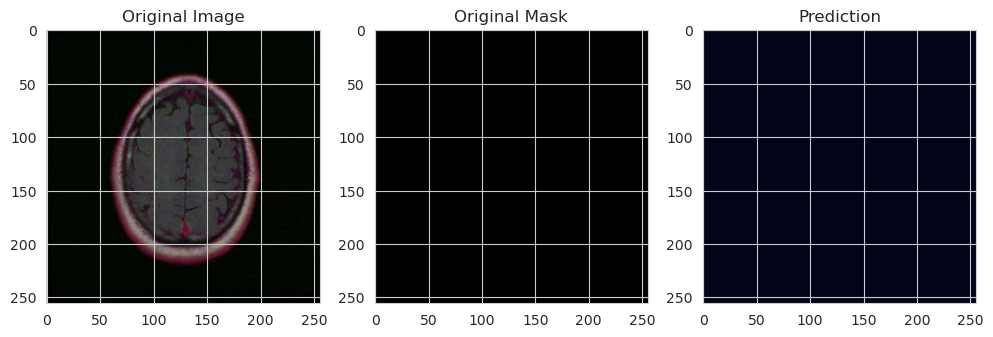

1/1 [==============================] - 0s 25ms/step


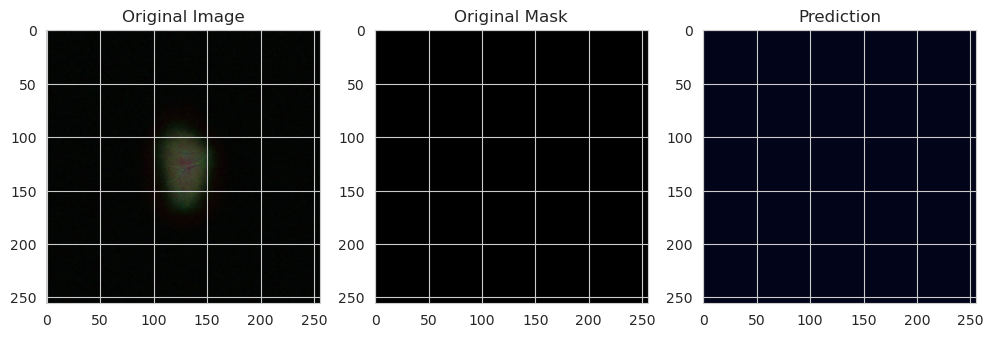

1/1 [==============================] - 0s 27ms/step


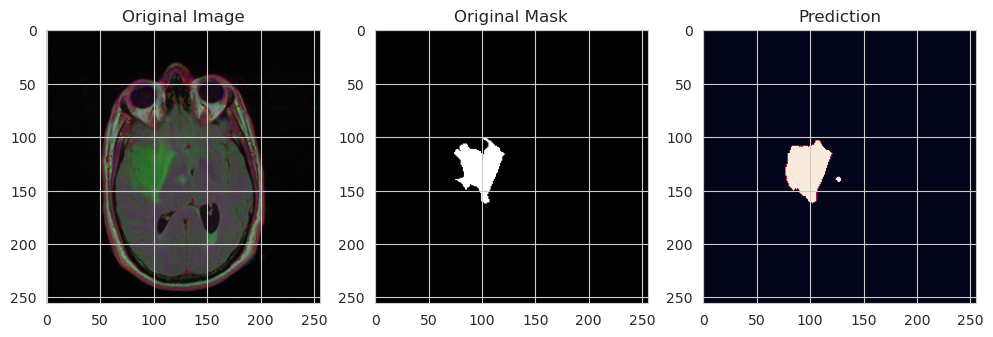

1/1 [==============================] - 0s 24ms/step


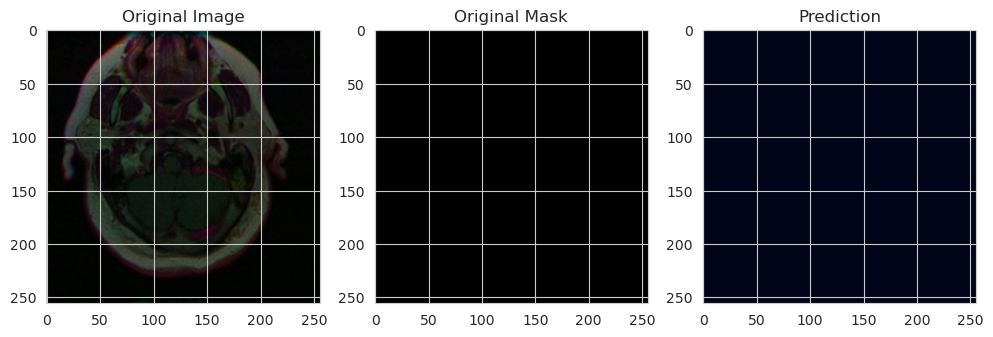

1/1 [==============================] - 0s 27ms/step


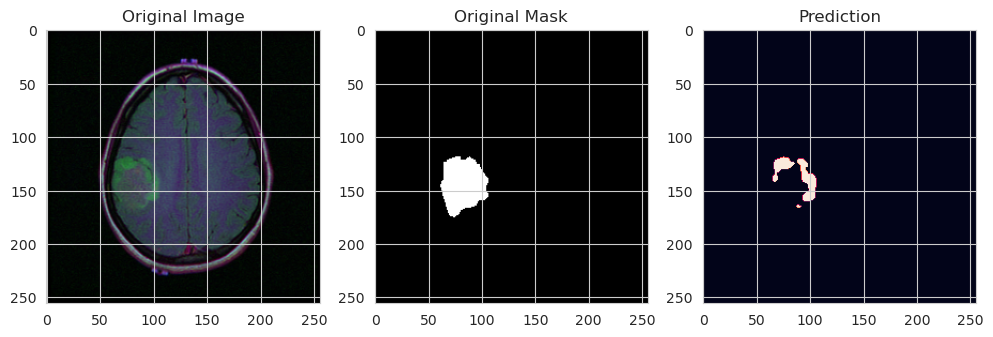

1/1 [==============================] - 0s 27ms/step


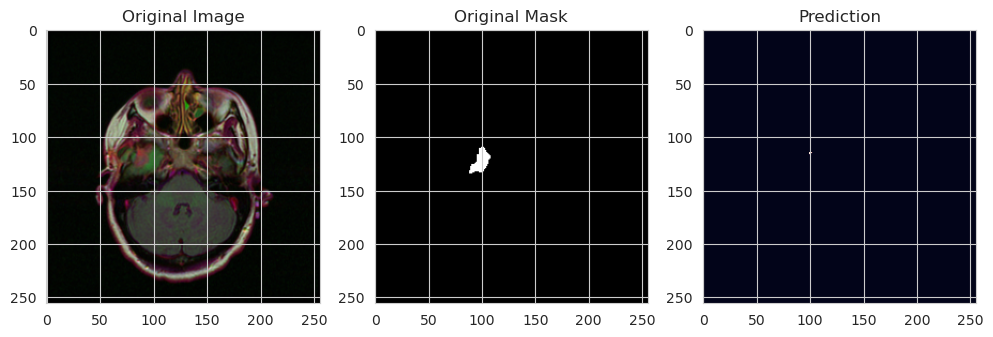

1/1 [==============================] - 0s 26ms/step


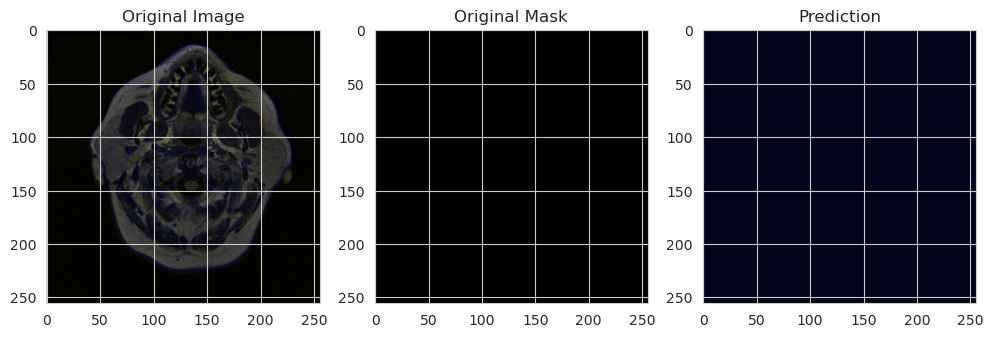

1/1 [==============================] - 0s 24ms/step


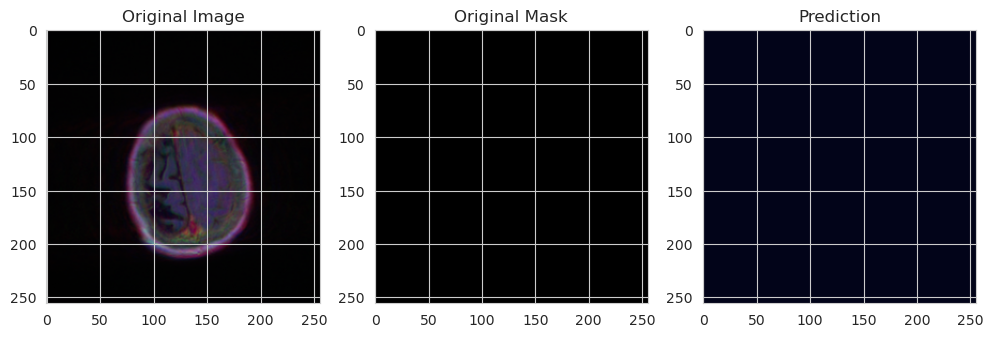

1/1 [==============================] - 0s 28ms/step


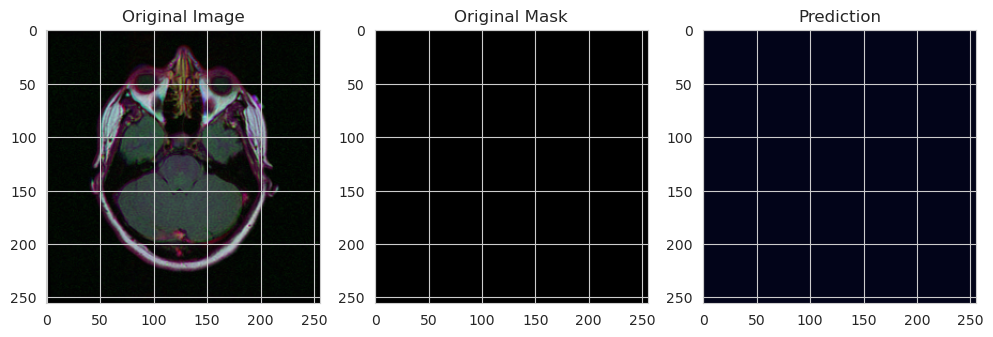

In [30]:
plot_segmentation_result(model_unet)

as we can see there are improvements need to be made

### modelV1--Unet-120 epochs

In [19]:
model_unet_V1 = build_unet(input_shape)

In [20]:
model_unet_V1.summary()

Model: "UNET"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_38 (Conv2D)             (None, 256, 256, 64  1792        ['input_3[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_36 (BatchN  (None, 256, 256, 64  256        ['conv2d_38[0][0]']              
 ormalization)                  )                                                              

In [21]:
EPOCHS = 120
BATCH_SIZE = 32
learning_rate = 1e-3

num_train_steps = len(df_train) * EPOCHS
lr_scheduler = PolynomialDecay(initial_learning_rate=learning_rate,end_learning_rate=1e-4,
                               decay_steps=num_train_steps)
optimizer = Adam(learning_rate=lr_scheduler)
callbacks_unet_V1 = [ModelCheckpoint('unet_150_epochs.hdf5', verbose=1,
                                      save_best_only=True)]
metrics=["binary_accuracy", iou, dice_coef]

In [22]:
model_unet_V1.compile(optimizer=optimizer, loss=dice_coef_loss, 
              metrics=metrics)

In [23]:
history_unet_V1 = model_unet_V1.fit(train_gen,
                    steps_per_epoch=len(df_train) / BATCH_SIZE, 
                    epochs=EPOCHS, 
                    callbacks=callbacks_unet_V1,
                    validation_data = val_gen,
                    validation_steps=len(df_val) / BATCH_SIZE)

Found 2828 validated image filenames.
Found 2828 validated image filenames.
Epoch 1/120
89/88 [==============================] - ETA: -1s - loss: 0.0244 - binary_accuracy: 0.9660 - iou: 0.0480 - dice_coef: 0.9756Found 708 validated image filenames.
Found 708 validated image filenames.

Epoch 1: val_loss improved from inf to 0.41454, saving model to unet_150_epochs.hdf5
88/88 [==============================] - 236s 2s/step - loss: 0.0244 - binary_accuracy: 0.9660 - iou: 0.0480 - dice_coef: 0.9756 - val_loss: 0.4145 - val_binary_accuracy: 0.1609 - val_iou: 0.0108 - val_dice_coef: 0.5855
Epoch 2/120
89/88 [==============================] - ETA: -1s - loss: 0.0062 - binary_accuracy: 0.9900 - iou: 0.0658 - dice_coef: 0.9938
Epoch 2: val_loss improved from 0.41454 to 0.03401, saving model to unet_150_epochs.hdf5
88/88 [==============================] - 179s 2s/step - loss: 0.0062 - binary_accuracy: 0.9900 - iou: 0.0658 - dice_coef: 0.9938 - val_loss: 0.0340 - val_binary_accuracy: 0.9377 - va

In [24]:
model_unet_V1.save('model_unet_V1-9th.h5')

In [33]:
np.save('unet_V1_history.npy',history_unet_V1.history)

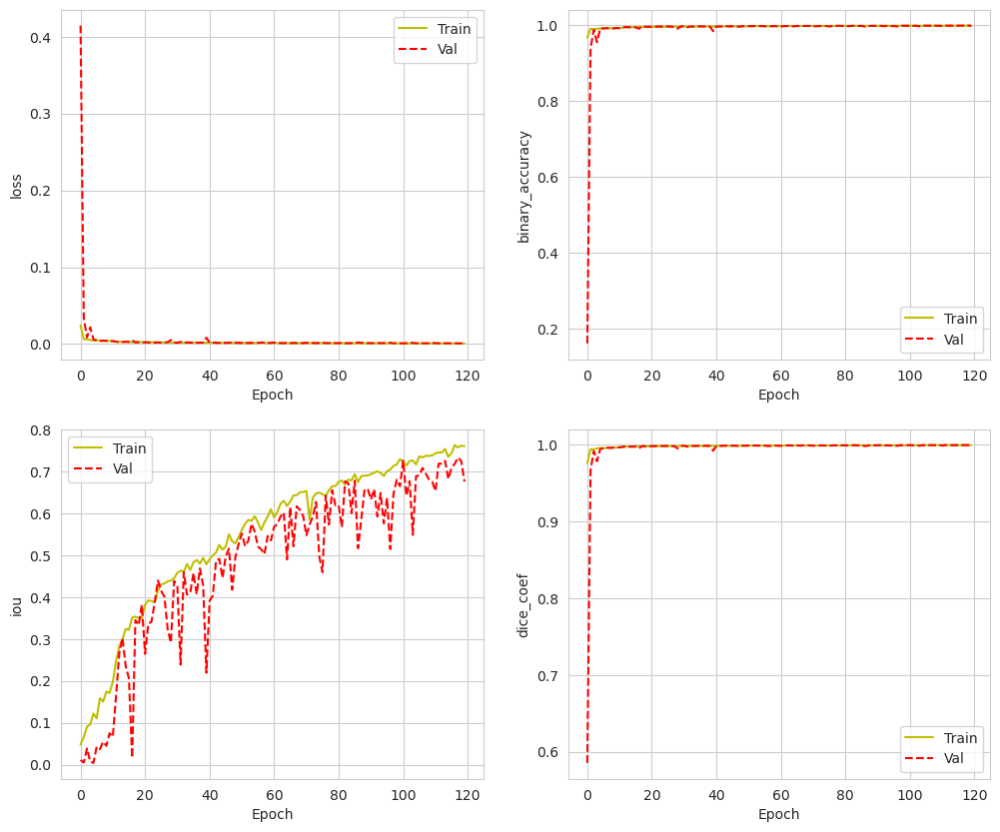

In [28]:
plot_metrics(history_unet_V1)

In [29]:
test_gen = train_generator(df_test, BATCH_SIZE, dict(), target_size=(im_height, im_width))

results = model_unet_V1.evaluate(test_gen, steps=len(df_test) / BATCH_SIZE )

print('Test Loss ', results[0] )
print('Test Binary Accuracy ', results[1] )
print('Test IoU ', results[2] )
print('Test Dice Coefficient ', results[3] )

Found 393 validated image filenames.
Found 393 validated image filenames.
12/12 [==============================] - 11s 929ms/step - loss: 7.1377e-04 - binary_accuracy: 0.9983 - iou: 0.7030 - dice_coef: 0.9993
Test Loss  0.0007137746433727443
Test Binary Accuracy  0.9982790350914001
Test IoU  0.703022301197052
Test Dice Coefficient  0.9992862939834595


In [31]:
def plot_segmentation_result(model):
    for i in range(20):
        index = np.random.randint(1, len(df_test.index))
        img = cv2.imread(df_test['image_filenames_train'].iloc[index])
        img = cv2.resize(img, (im_height, im_width))
        img = img/255
        # print(imgs.shape) (256, 256 , 3)
        img = img[np.newaxis, :, :, : ]
        # print(img.shape) # (1, 256, 256, 3)

        predicted_img = model.predict(img)

        plt.figure(figsize=(12, 12))
        plt.subplot(1, 3, 1)
        plt.imshow(np.squeeze(img))
        plt.title('Original Image')

        plt.subplot(1, 3, 2)
        plt.imshow(np.squeeze(cv2.imread(df_test['mask'].iloc[index])))
        plt.title('Original Mask')

        plt.subplot(1, 3, 3)
        plt.imshow(np.squeeze(predicted_img) > 0.5 )
        plt.title('Prediction')
        plt.show()

1/1 [==============================] - 2s 2s/step


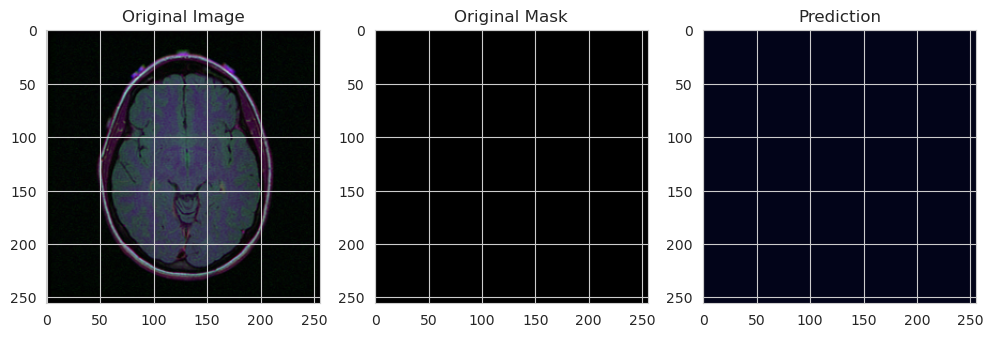

1/1 [==============================] - 0s 24ms/step


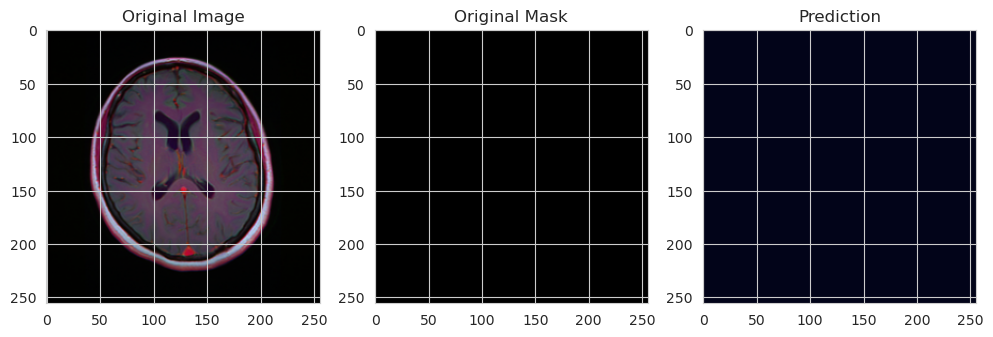

1/1 [==============================] - 0s 26ms/step


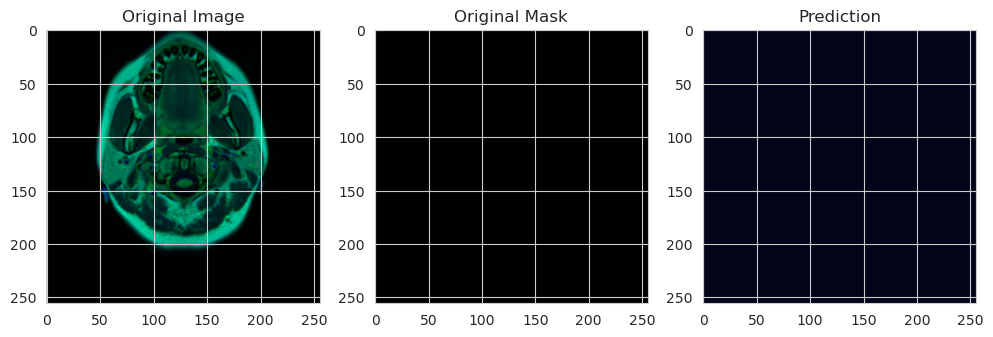

1/1 [==============================] - 0s 25ms/step


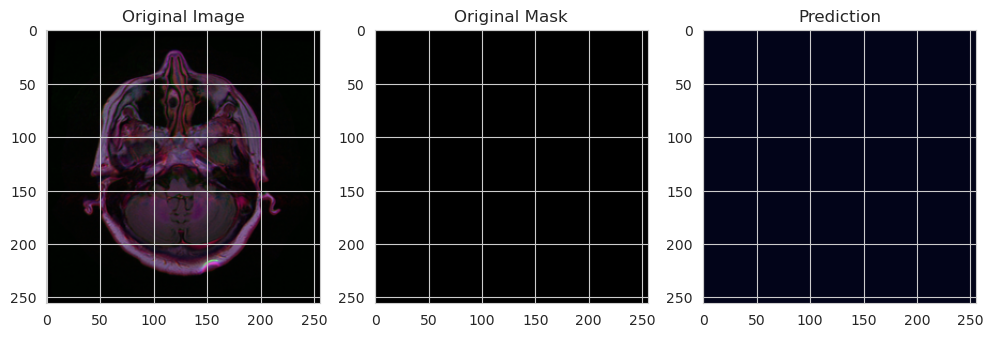

1/1 [==============================] - 0s 27ms/step


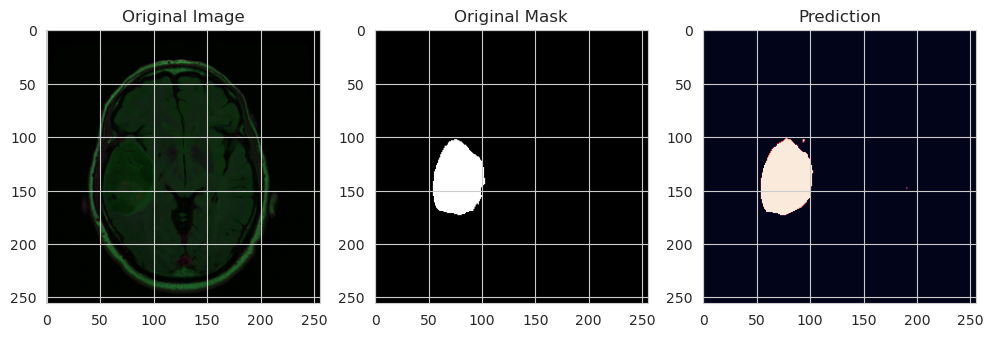

1/1 [==============================] - 0s 26ms/step


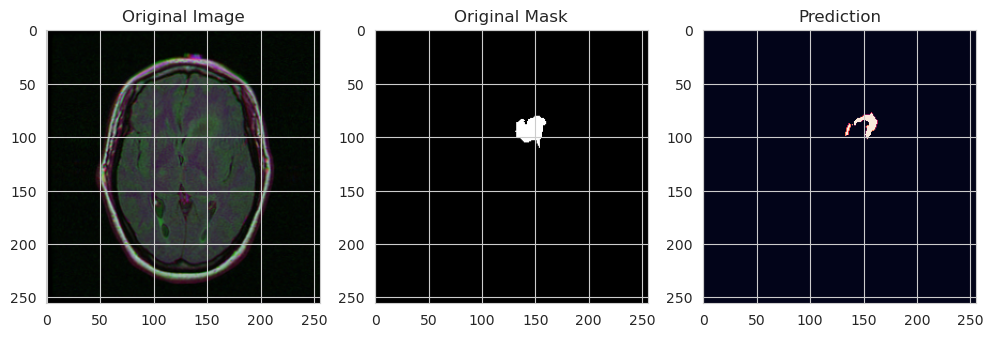

1/1 [==============================] - 0s 25ms/step


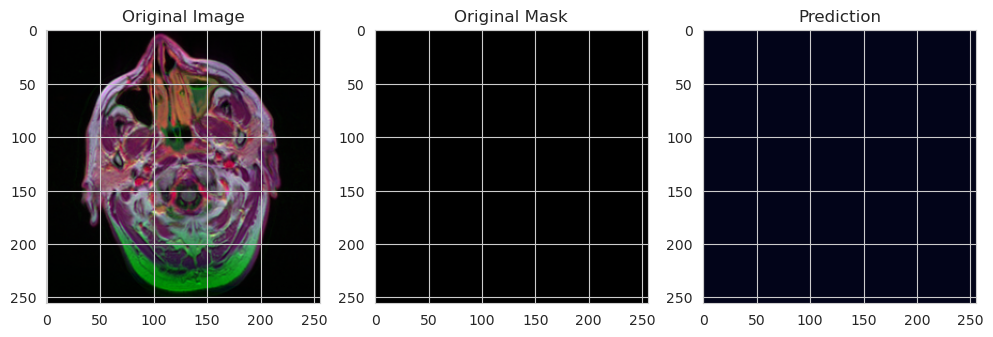

1/1 [==============================] - 0s 26ms/step


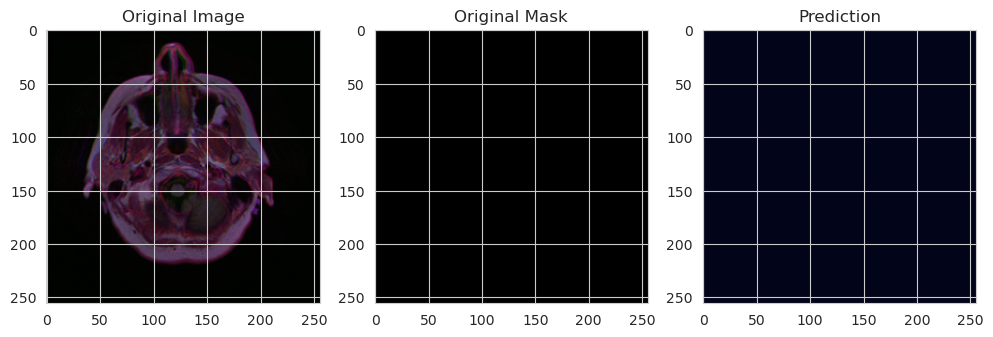

1/1 [==============================] - 0s 26ms/step


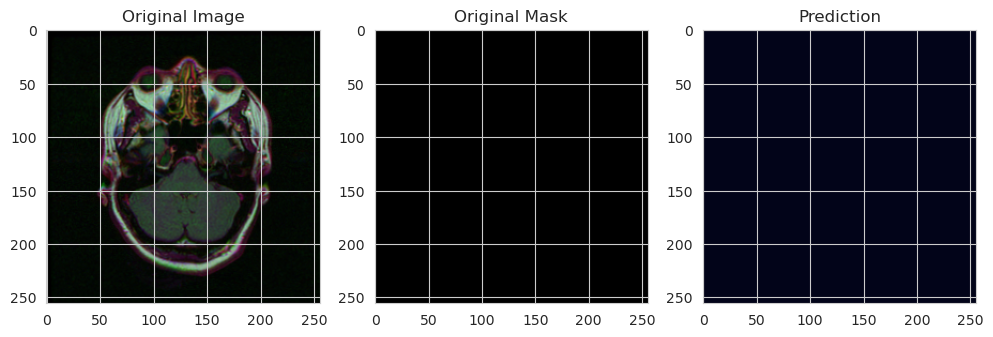

1/1 [==============================] - 0s 25ms/step


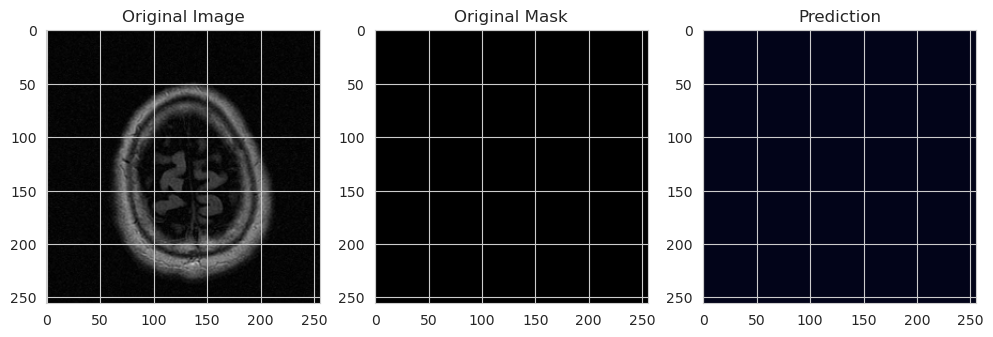

1/1 [==============================] - 0s 26ms/step


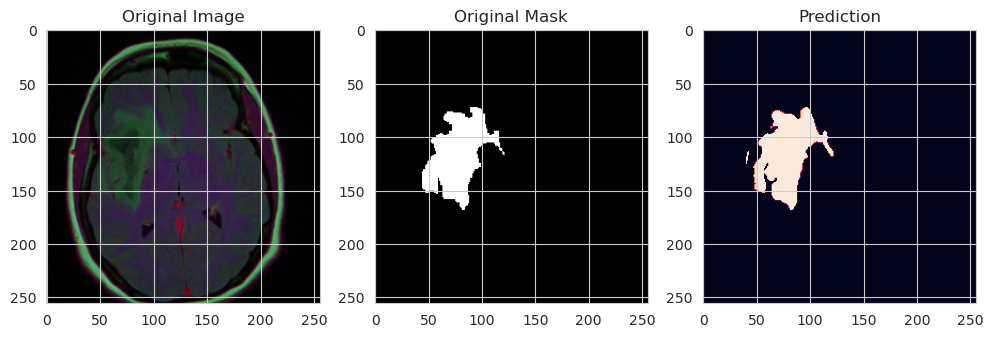

1/1 [==============================] - 0s 28ms/step


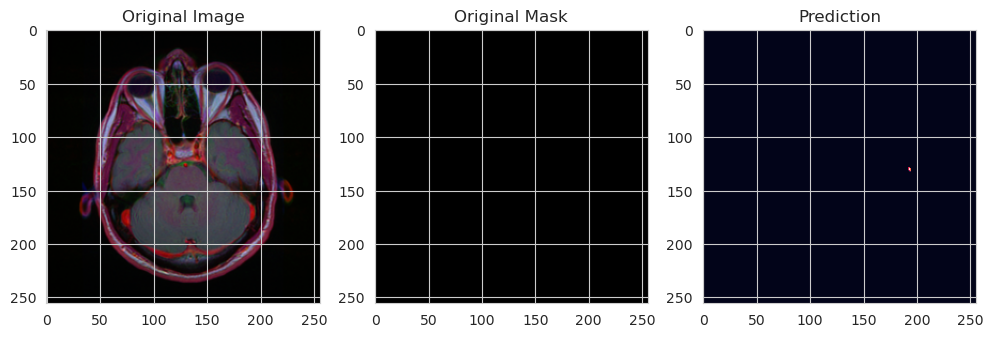

1/1 [==============================] - 0s 25ms/step


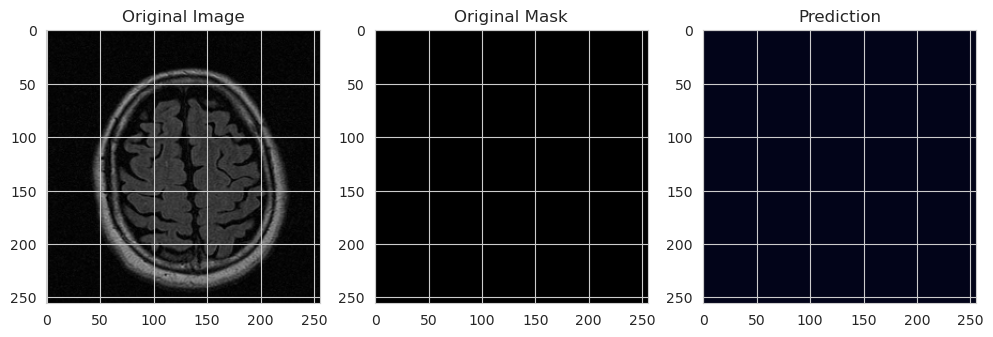

1/1 [==============================] - 0s 25ms/step


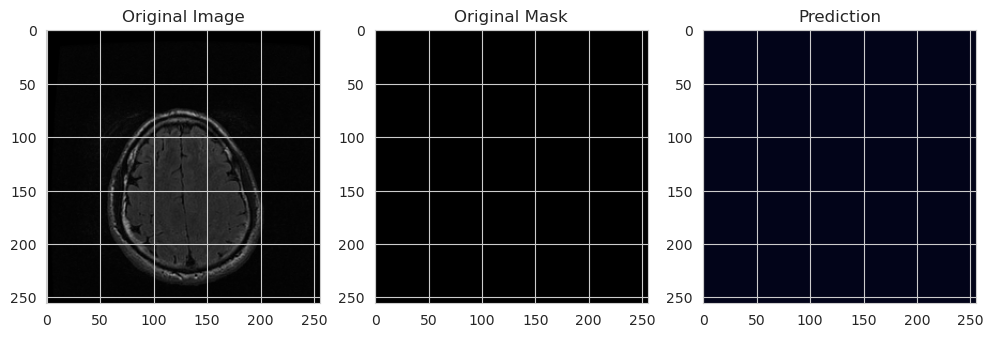

1/1 [==============================] - 0s 24ms/step


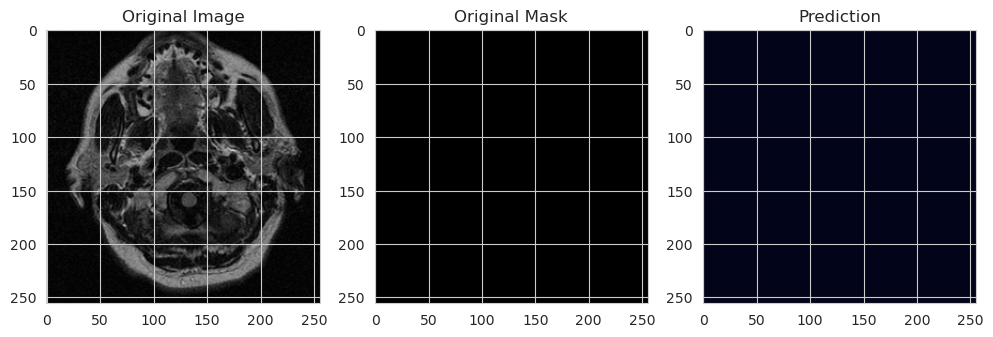

1/1 [==============================] - 0s 25ms/step


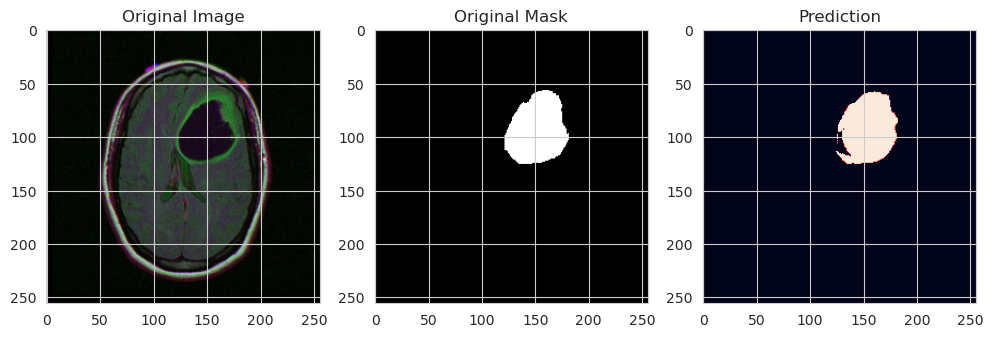

1/1 [==============================] - 0s 24ms/step


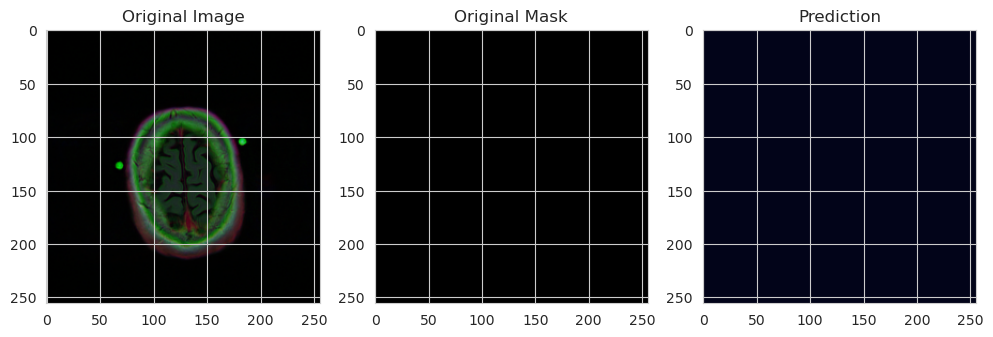

1/1 [==============================] - 0s 25ms/step


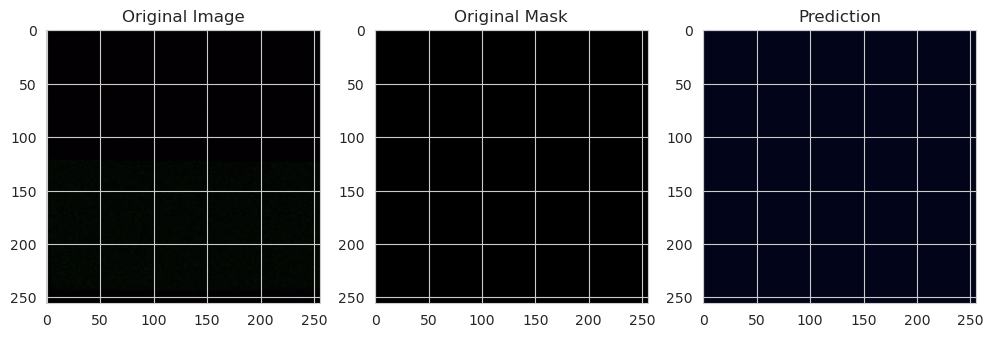

1/1 [==============================] - 0s 25ms/step


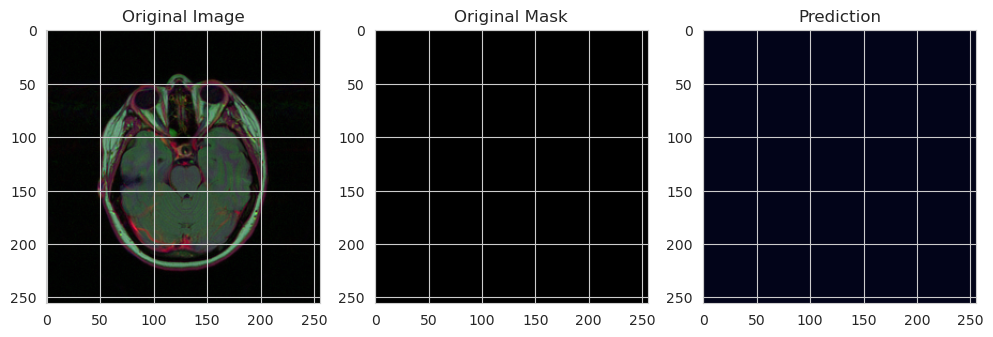

1/1 [==============================] - 0s 25ms/step


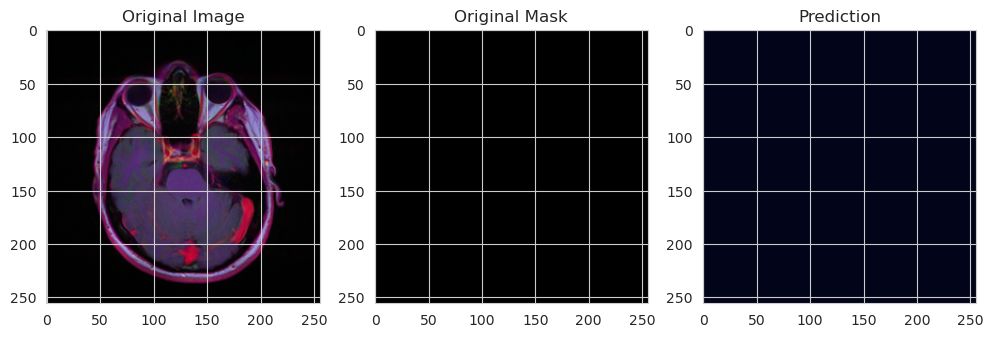

In [32]:
plot_segmentation_result(model_unet_V1)

#### vgg16 model

In [19]:
from tensorflow.keras.layers import Conv2D, BatchNormalization, Activation, MaxPool2D, Conv2DTranspose, Concatenate, Input
from tensorflow.keras.models import Model
from tensorflow.keras.applications import VGG16
 
def conv_block(input, num_filters):
    x = Conv2D(num_filters, 3, padding="same")(input)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)
 
    x = Conv2D(num_filters, 3, padding="same")(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)
 
    return x
 
def decoder_block(input, skip_features, num_filters):
    x = Conv2DTranspose(num_filters, (2, 2), strides=2, padding="same")(input)
    x = Concatenate()([x, skip_features])
    x = conv_block(x, num_filters)
    return x
 
def build_vgg16_unet(input_shape):
    """ Input """
    inputs = Input(input_shape)
 
    """ Pre-trained VGG16 Model """
    vgg16 = VGG16(include_top=False, weights="imagenet", input_tensor=inputs)
 
    """ Encoder """
    s1 = vgg16.get_layer("block1_conv2").output         ## (512 x 512)
    s2 = vgg16.get_layer("block2_conv2").output         ## (256 x 256)
    s3 = vgg16.get_layer("block3_conv3").output         ## (128 x 128)
    s4 = vgg16.get_layer("block4_conv3").output         ## (64 x 64)
 
    """ Bridge """
    b1 = vgg16.get_layer("block5_conv3").output         ## (32 x 32)
 
    """ Decoder """
    d1 = decoder_block(b1, s4, 512)                     ## (64 x 64)
    d2 = decoder_block(d1, s3, 256)                     ## (128 x 128)
    d3 = decoder_block(d2, s2, 128)                     ## (256 x 256)
    d4 = decoder_block(d3, s1, 64)                      ## (512 x 512)
 
    """ Output """
    outputs = Conv2D(1, 1, padding="same", activation="sigmoid")(d4)
 
    model = Model(inputs, outputs, name="VGG16_U-Net")
    return model


In [21]:
model_vgg=build_vgg16_unet(input_shape)
model_vgg.summary()

58889256/58889256 [==============================] - 0s 0us/step
Model: "VGG16_U-Net"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 256, 256, 64  1792        ['input_3[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv2 (Conv2D)          (None, 256, 256, 64  36928       ['block1_conv1[0][0]']           
                       

In [22]:
from keras.callbacks import ReduceLROnPlateau
callbacks_vgg = [
    EarlyStopping(patience=10, verbose=1),
    ReduceLROnPlateau(monitor='val_loss',factor=0.2, patience=5, min_lr=1e-5, verbose=1),
    ModelCheckpoint('vgg.h5', verbose=1, save_best_only=True)
]
metrics=["binary_accuracy", iou, dice_coef]


In [23]:
model_vgg.compile(optimizer=Adam(), loss=dice_coef_loss, 
              metrics=metrics)

In [24]:
BATCH_SIZE = 32

history_vgg = model_vgg.fit(train_gen,
                    steps_per_epoch=len(df_train) / BATCH_SIZE, 
                    batch_size=BATCH_SIZE,
                    epochs=EPOCHS, 
                    callbacks=callbacks_vgg,
                    validation_data = val_gen,
                    validation_steps=len(df_val) / BATCH_SIZE)

Found 2828 validated image filenames.
Found 2828 validated image filenames.
Epoch 1/120
89/88 [==============================] - ETA: -1s - loss: 0.0333 - binary_accuracy: 0.9552 - iou: 0.0340 - dice_coef: 0.9667Found 708 validated image filenames.
Found 708 validated image filenames.

Epoch 1: val_loss improved from inf to 0.23224, saving model to vgg.h5
88/88 [==============================] - 222s 2s/step - loss: 0.0333 - binary_accuracy: 0.9552 - iou: 0.0340 - dice_coef: 0.9667 - val_loss: 0.2322 - val_binary_accuracy: 0.4834 - val_iou: 0.0139 - val_dice_coef: 0.7678 - lr: 0.0010
Epoch 2/120
89/88 [==============================] - ETA: -1s - loss: 0.0062 - binary_accuracy: 0.9906 - iou: 0.0632 - dice_coef: 0.9938
Epoch 2: val_loss improved from 0.23224 to 0.00960, saving model to vgg.h5
88/88 [==============================] - 173s 2s/step - loss: 0.0062 - binary_accuracy: 0.9906 - iou: 0.0632 - dice_coef: 0.9938 - val_loss: 0.0096 - val_binary_accuracy: 0.9912 - val_iou: 0.0395 -

In [ ]:
from keras.callbacks import ReduceLROnPlateau
callbacks_vgg0 = [
    EarlyStopping(patience=10, verbose=1),
    ReduceLROnPlateau(monitor='val_loss',factor=0.5, patience=10, min_lr=1e-5, verbose=1),
    ModelCheckpoint('vgg0.h5', verbose=1, save_best_only=True)
]
metrics=["binary_accuracy", iou, dice_coef]


In [19]:
EPOCHS=120
BATCH_SIZE = 32
history_vgg = model_vgg.fit(train_gen,
                    steps_per_epoch=len(df_train) / BATCH_SIZE, 
                    batch_size=BATCH_SIZE,
                    epochs=EPOCHS, 
                    callbacks=callbacks_vgg0,
                    validation_data = val_gen,
                    validation_steps=len(df_val) / BATCH_SIZE)

Found 2828 validated image filenames.

Found 2828 validated image filenames.

Epoch 1/20

89/88 [==============================] - ETA: -1s - loss: 0.0483 - binary_accuracy: 0.9648 - iou: 0.0294 - dice_coef: 0.9517Found 708 validated image filenames.

Found 708 validated image filenames.



Epoch 1: val_loss improved from inf to 0.09858, saving model to vgg.hdf5

88/88 [==============================] - 221s 2s/step - loss: 0.0483 - binary_accuracy: 0.9648 - iou: 0.0294 - dice_coef: 0.9517 - val_loss: 0.0986 - val_binary_accuracy: 0.9696 - val_iou: 0.0264 - val_dice_coef: 0.9014

Epoch 2/20

89/88 [==============================] - ETA: 0s - loss: 0.0110 - binary_accuracy: 0.9923 - iou: 0.0603 - dice_coef: 0.9890

Epoch 2: val_loss did not improve from 0.09858

88/88 [==============================] - 161s 2s/step - loss: 0.0110 - binary_accuracy: 0.9923 - iou: 0.0603 - dice_coef: 0.9890 - val_loss: 0.2942 - val_binary_accuracy: 0.4000 - val_iou: 0.0140 - val_dice_coef: 0.7058

Epoch 3

In [21]:
model_vggV0.save('vgg16V0.hdf5')

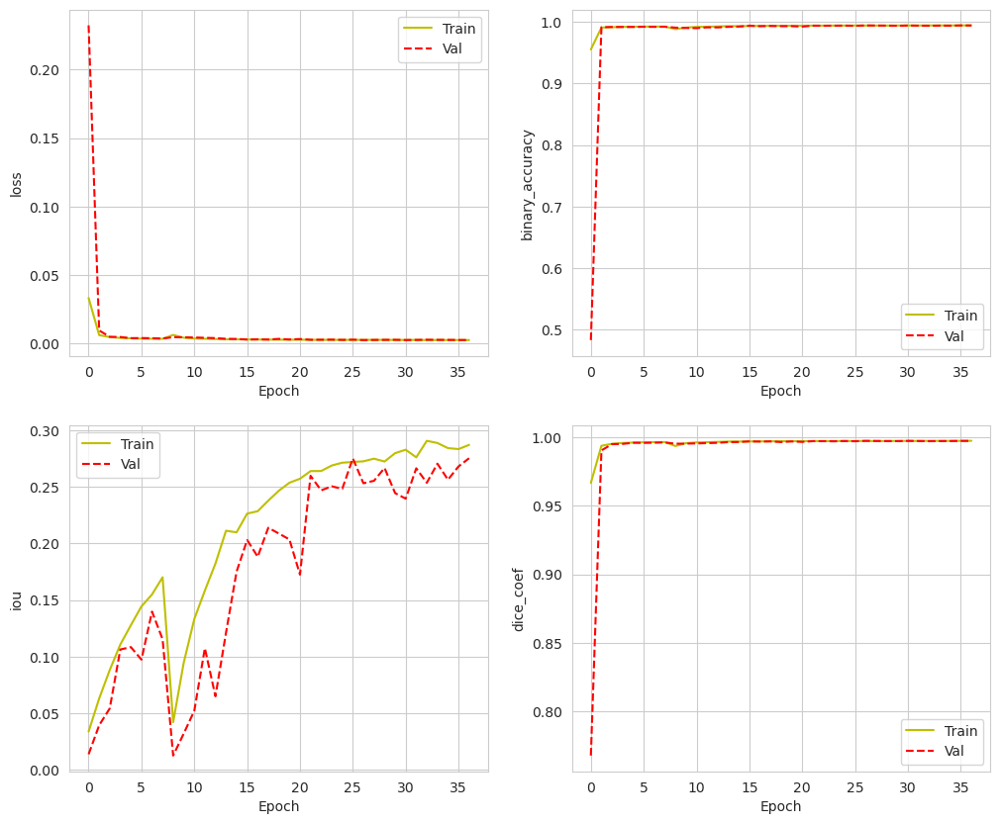

In [33]:
plot_metrics(history_vggV0)

In [34]:
#Evaluate trained vgg model
test_gen = train_generator(df_test, BATCH_SIZE, dict(), target_size=(im_height, im_width))
results_vggV0 = model_vggV0.evaluate(test_gen, steps=len(df_test) / BATCH_SIZE )

print('Test Loss ', results_vgg[0] )
print('Test Binary Accuracy ', results_vgg[1] )
print('Test IoU ', results_vgg[2] )
print('Test Dice Coefficient ', results_vgg[3] )

Found 393 validated image filenames.
Found 393 validated image filenames.
12/12 [==============================] - 11s 944ms/step - loss: 0.0027 - binary_accuracy: 0.9939 - iou: 0.2841 - dice_coef: 0.9973
Test Loss  0.0026593885850161314
Test Binary Accuracy  0.9939333200454712
Test IoU  0.28412601351737976
Test Dice Coefficient  0.9973406195640564


1/1 [==============================] - 2s 2s/step


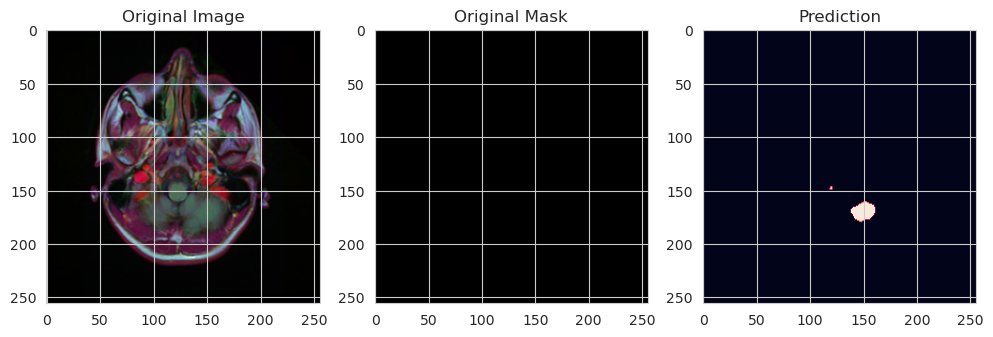

1/1 [==============================] - 0s 29ms/step


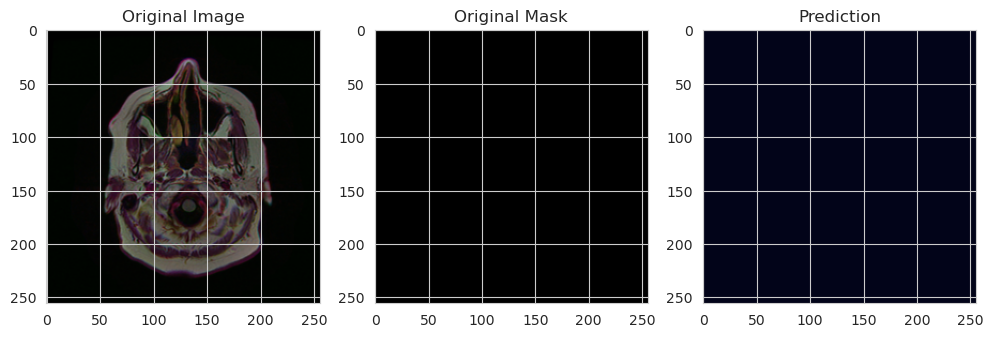

1/1 [==============================] - 0s 28ms/step


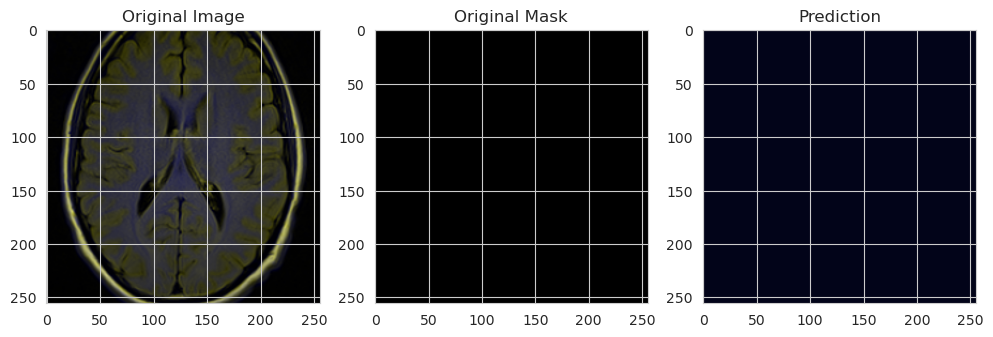

1/1 [==============================] - 0s 26ms/step


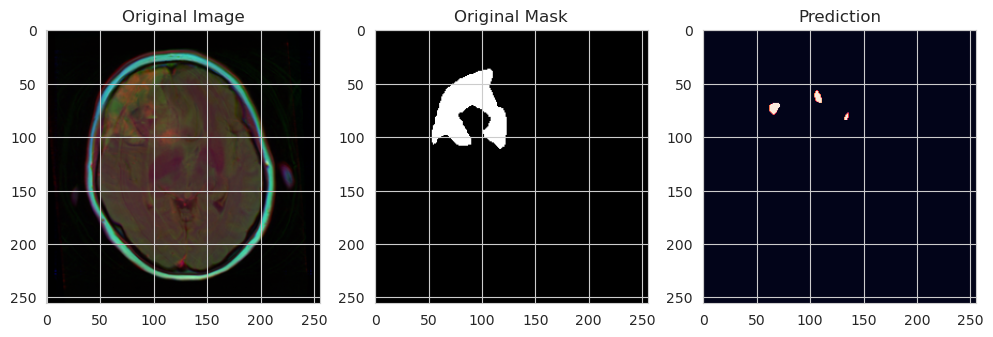

1/1 [==============================] - 0s 27ms/step


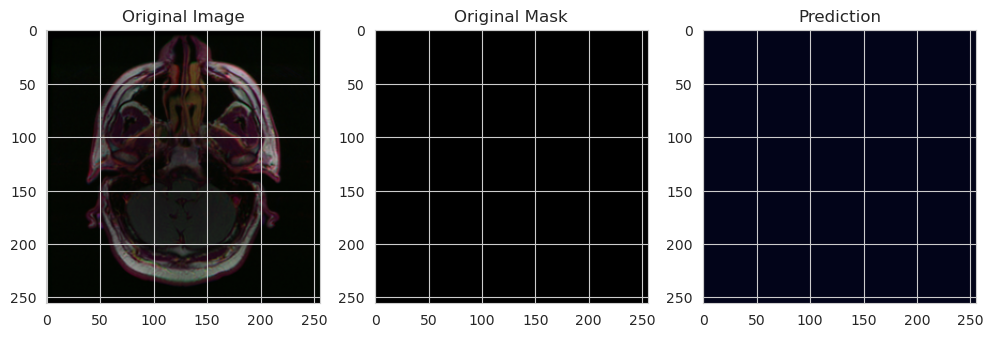

1/1 [==============================] - 0s 26ms/step


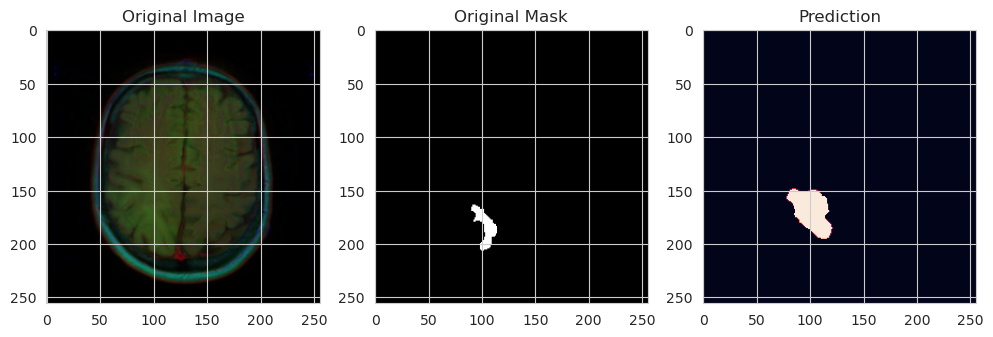

1/1 [==============================] - 0s 26ms/step


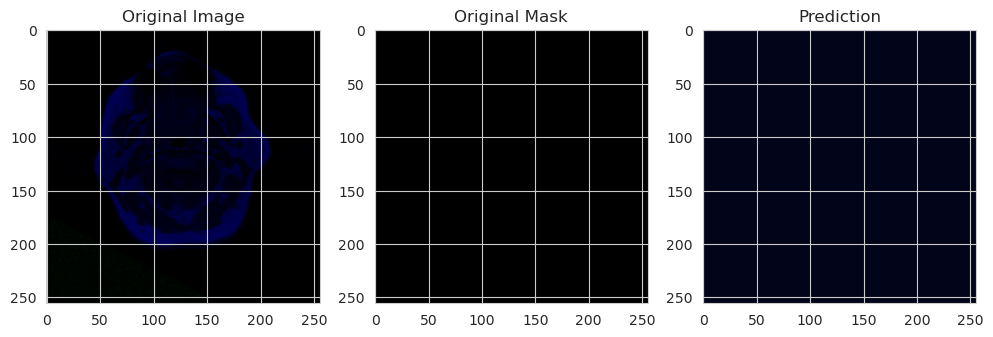

1/1 [==============================] - 0s 51ms/step


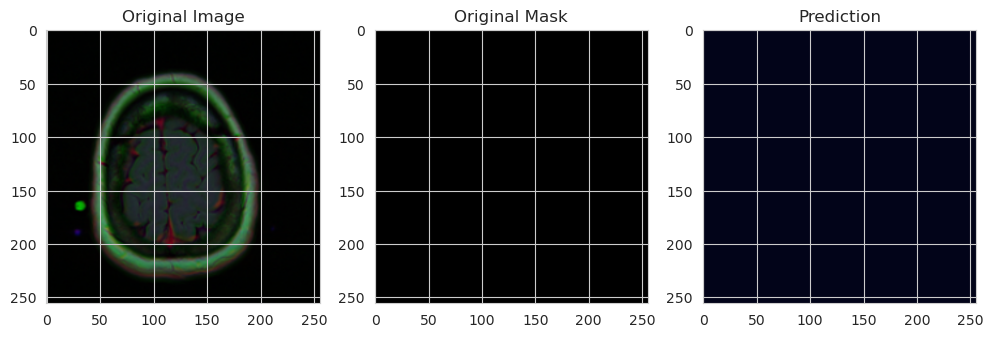

1/1 [==============================] - 0s 25ms/step


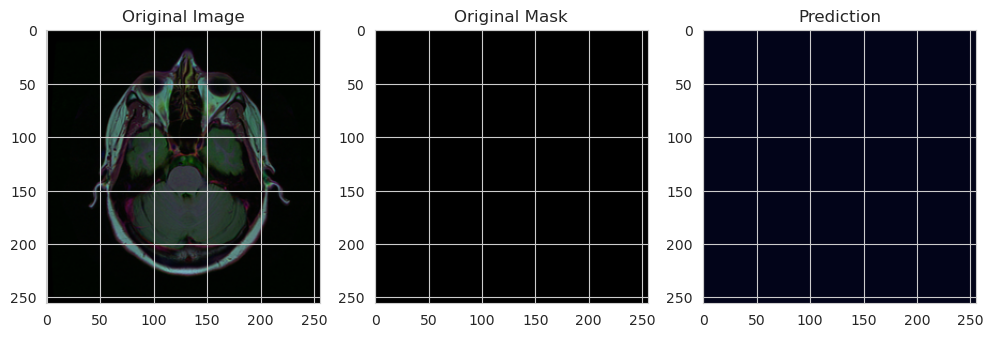

1/1 [==============================] - 0s 28ms/step


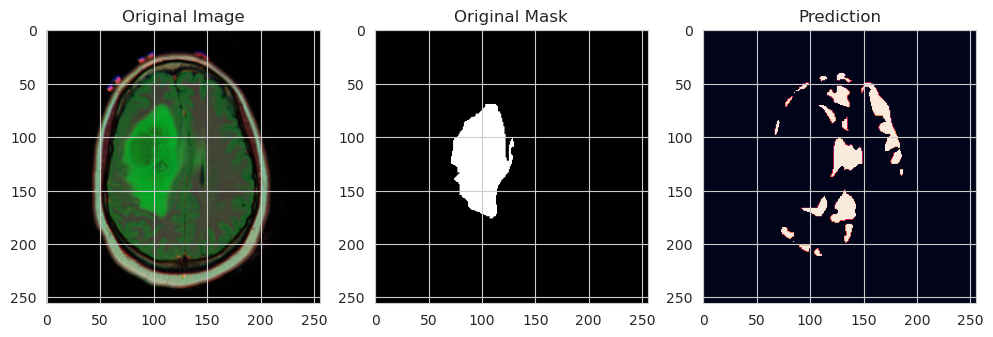

1/1 [==============================] - 0s 26ms/step


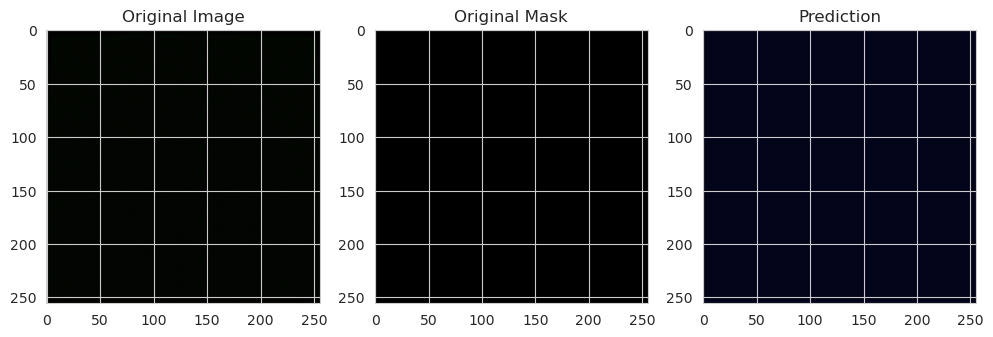

1/1 [==============================] - 0s 26ms/step


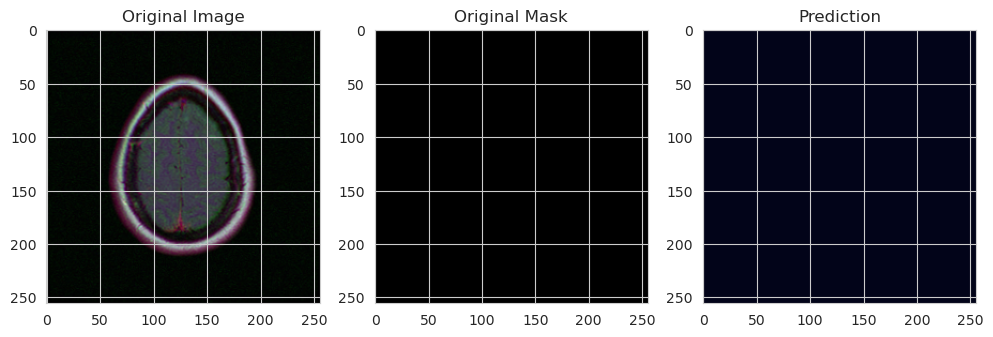

1/1 [==============================] - 0s 26ms/step


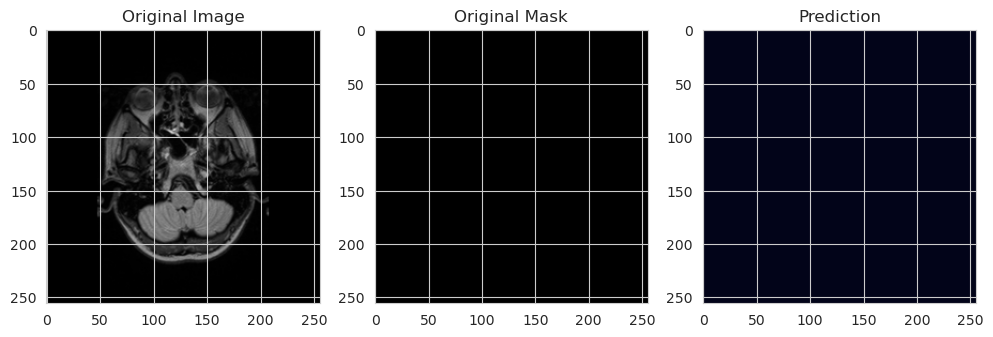

1/1 [==============================] - 0s 27ms/step


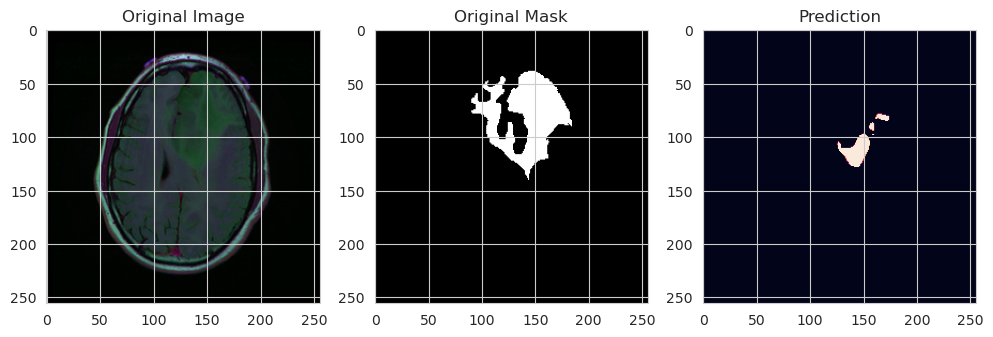

1/1 [==============================] - 0s 25ms/step


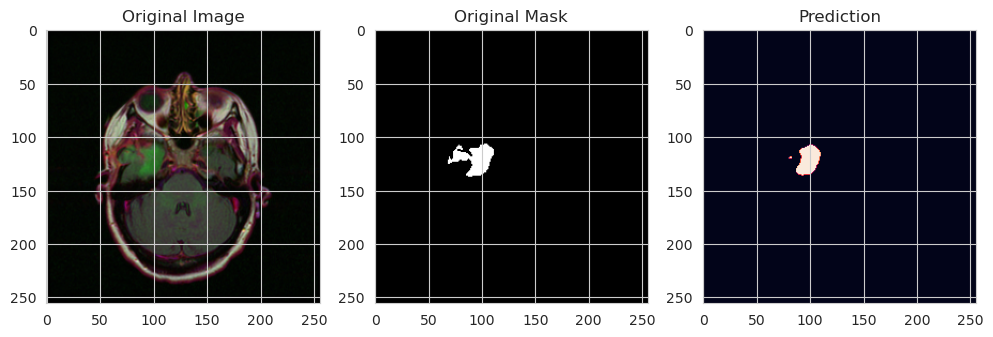

1/1 [==============================] - 0s 24ms/step


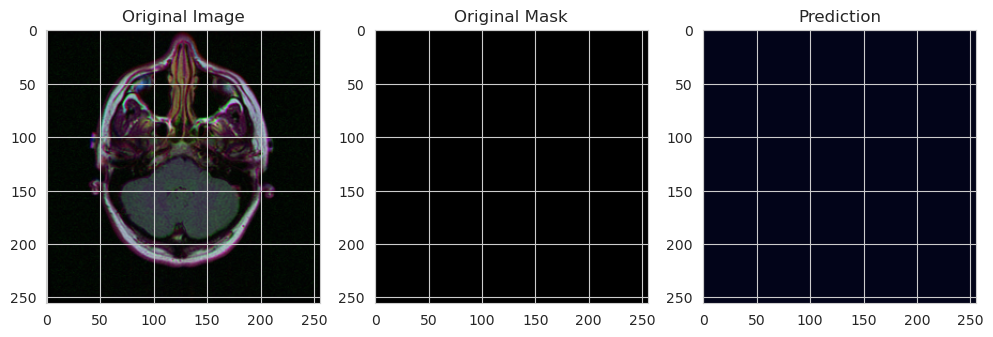

1/1 [==============================] - 0s 26ms/step


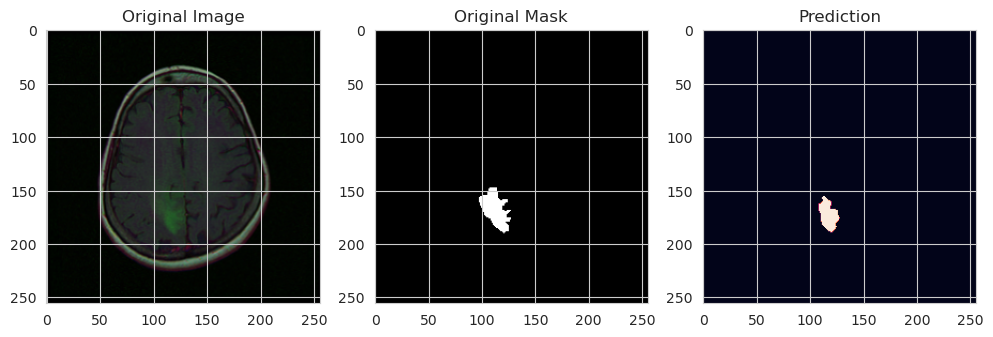

1/1 [==============================] - 0s 24ms/step


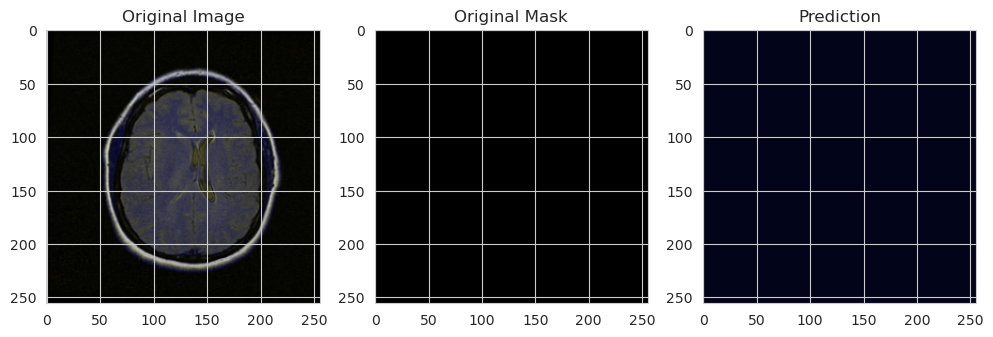

1/1 [==============================] - 0s 23ms/step


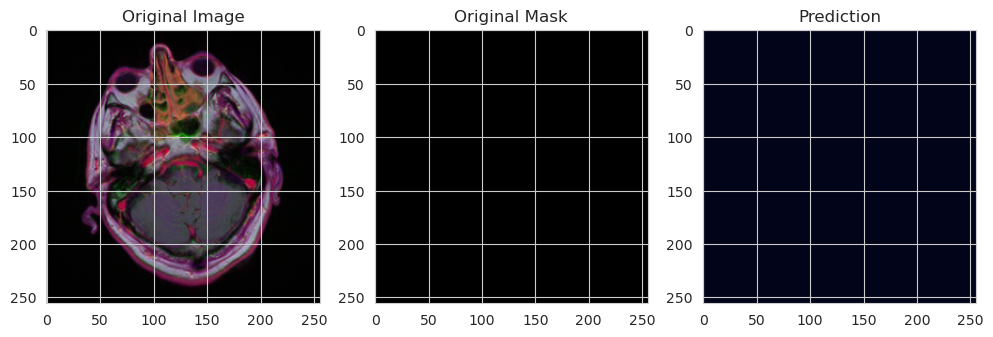

1/1 [==============================] - 0s 26ms/step


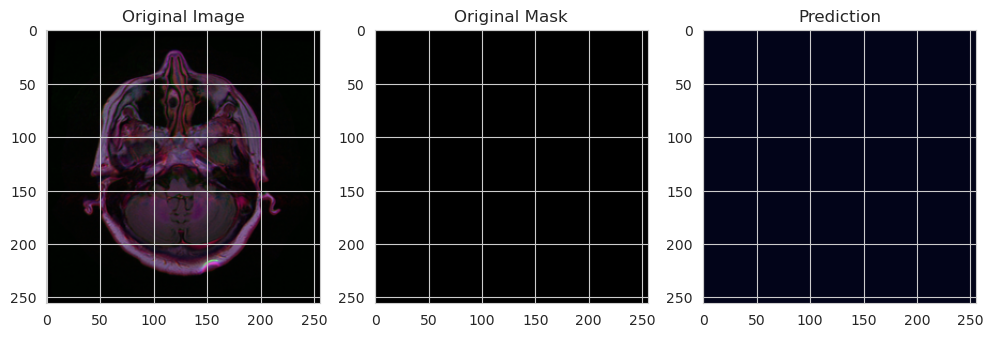

In [35]:
plot_segmentation_result(model_vggV0)

### model vggv1

In [20]:
model_vggV1=build_vgg16_unet(input_shape)
model_vggV1.summary()

58889256/58889256 [==============================] - 0s 0us/step
Model: "VGG16_U-Net"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 256, 256, 64  1792        ['input_3[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv2 (Conv2D)          (None, 256, 256, 64  36928       ['block1_conv1[0][0]']           
                       

In [21]:
EPOCHS = 120
BATCH_SIZE = 32
learning_rate = 1e-3

num_train_steps = len(df_train) * EPOCHS
lr_scheduler = PolynomialDecay(initial_learning_rate=learning_rate,end_learning_rate=1e-4,
                               decay_steps=num_train_steps)
optimizer = Adam(learning_rate=lr_scheduler)
callbacks_vgg_1 = [ModelCheckpoint('vggV1.hdf5', verbose=1,
                                      save_best_only=True)]
metrics=["binary_accuracy", iou, dice_coef]

In [22]:

model_vggV1.compile(optimizer=optimizer, loss=dice_coef_loss, 
              metrics=metrics)

In [ ]:
# model_vggV1 = model_vgg.fit(train_gen,
#                     steps_per_epoch=len(df_train) / BATCH_SIZE, 
#                     batch_size=BATCH_SIZE,
#                     epochs=EPOCHS, 
#                     callbacks=callbacks_vgg,
#                     validation_data = val_gen,
#                     validation_steps=len(df_val) / BATCH_SIZE)

In [23]:
history_vggV1 = model_vggV1.fit(train_gen,
                    steps_per_epoch=len(df_train) / BATCH_SIZE, 
                    epochs=EPOCHS, 
                    callbacks=callbacks_vgg_1,
                    validation_data = val_gen,
                    validation_steps=len(df_val) / BATCH_SIZE)

Found 2828 validated image filenames.
Found 2828 validated image filenames.
Epoch 1/120
89/88 [==============================] - ETA: -1s - loss: 0.0252 - binary_accuracy: 0.9647 - iou: 0.0436 - dice_coef: 0.9748Found 708 validated image filenames.
Found 708 validated image filenames.

Epoch 1: val_loss improved from inf to 0.07543, saving model to vggV1.hdf5
88/88 [==============================] - 220s 2s/step - loss: 0.0252 - binary_accuracy: 0.9647 - iou: 0.0436 - dice_coef: 0.9748 - val_loss: 0.0754 - val_binary_accuracy: 0.9878 - val_iou: 0.0170 - val_dice_coef: 0.9246
Epoch 2/120
89/88 [==============================] - ETA: 0s - loss: 0.0049 - binary_accuracy: 0.9911 - iou: 0.0764 - dice_coef: 0.9951
Epoch 2: val_loss improved from 0.07543 to 0.00701, saving model to vggV1.hdf5
88/88 [==============================] - 153s 2s/step - loss: 0.0049 - binary_accuracy: 0.9911 - iou: 0.0764 - dice_coef: 0.9951 - val_loss: 0.0070 - val_binary_accuracy: 0.9923 - val_iou: 0.0470 - val_d

In [29]:
import pickle
with open('/history_vggV1', 'wb') as file_pi:
    pickle.dump(history_vggV1.history, file_pi)
    

In [ ]:
# with open('/history_vggV1', "rb") as file_pi:
#     history = pickle.load(file_pi)

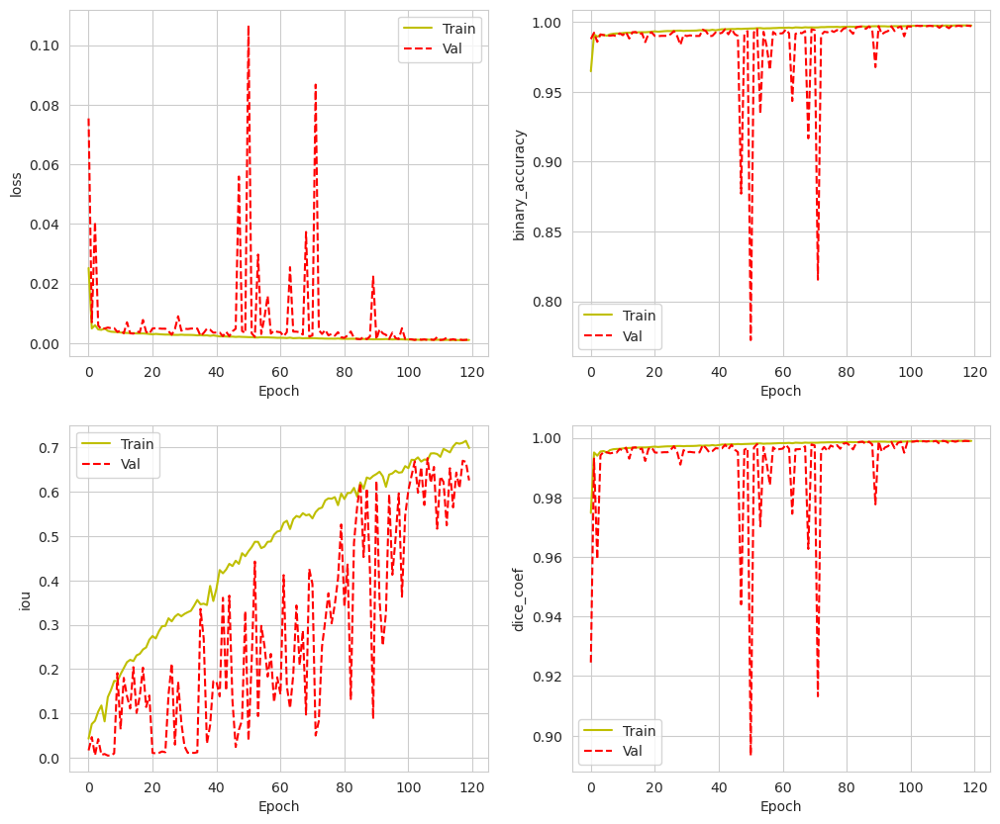

In [24]:
plot_metrics(history_vggV1)

In [27]:
#Evaluate trained vggV1 model
# test_gen = train_generator(df_test, BATCH_SIZE, dict(), target_size=(im_height, im_width))
# results_vggV1 = model_vggV1.evaluate(test_gen, steps=len(df_test) / BATCH_SIZE )

print('Test Loss ', results_vggV1[0] )
print('Test Binary Accuracy ', results_vggV1[1] )
print('Test IoU ', results_vggV1[2] )
print('Test Dice Coefficient ', results_vggV1[3] )

Test Loss  0.0011961989803239703
Test Binary Accuracy  0.9970813393592834
Test IoU  0.6399990916252136
Test Dice Coefficient  0.9988038539886475


In [28]:
results_vggV1

[0.0011961989803239703,
 0.9970813393592834,
 0.6399990916252136,
 0.9988038539886475]

In [31]:
# np.save('vgg1_history.npy',history_vggV1.history)
# history=np.load('vgg1_history.npy',allow_pickle='TRUE').item()

In [11]:
Results=[0.0007137746433727443, 0.9982790350914001, 0.703022301197052, 0.9992862939834595]
results_vggV1 =[0.0011961989803239703, 0.9970813393592834, 0.6399990916252136,0.9988038539886475]

In [13]:
test_results = pd.DataFrame(
    {'results_unet': Results,
     'results_vgg': results_vggV1},
    index=['Loss', 'Binary_Accuracy', 'IoU', 'Dice_Coefficient'])
test_results

,results_unet,results_vgg
Loss,0.000714,0.001196
Binary_Accuracy,0.998279,0.997081
IoU,0.703022,0.639999
Dice_Coefficient,0.999286,0.998804


As we can see, Unet is slightly better